## Импорт библиотек и методов

In [1]:
import numpy as np                                      
import pandas as pd                                     
import matplotlib.pyplot as plt                        
import seaborn as sns                                   
from pandas import DataFrame                            
from sklearn.preprocessing import LabelEncoder          
from sklearn.preprocessing import MinMaxScaler, RobustScaler, StandardScaler, PowerTransformer, Normalizer   
from sklearn.model_selection import train_test_split    
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, mean_absolute_percentage_error 
from sklearn.neighbors import KNeighborsRegressor       
from sklearn.svm import SVR                             
from sklearn.linear_model import LinearRegression      
from sklearn.tree import DecisionTreeRegressor         
from sklearn.ensemble import AdaBoostRegressor          
from sklearn.ensemble import GradientBoostingRegressor 
from xgboost import XGBRegressor                        
from sklearn.ensemble import RandomForestRegressor      
from sklearn.linear_model import SGDRegressor          
from sklearn.linear_model import Lasso                  
from scipy import stats                                 
from scipy.stats import shapiro                                    
from sklearn.pipeline import make_pipeline              
from sklearn.model_selection import GridSearchCV        
import tensorflow.keras as keras                       
from keras.models import Sequential
from keras.layers import Dense, Flatten, Input, Dropout
from tensorflow.keras import utils
from tensorflow.keras.optimizers import Adam, SGD, RMSprop, Adagrad
from scikeras.wrappers import KerasRegressor
from joblib import dump, load                          
from tensorflow.keras.models import load_model          
import warnings                                         
warnings.filterwarnings("default", category=FutureWarning)
warnings.simplefilter(action='ignore', category=FutureWarning)
import flask                                            
from flask import Flask, request, render_template
%matplotlib inline  

In [2]:
!pip install xgboost

In [3]:
pip install scikeras[tensorflow]

Note: you may need to restart the kernel to use updated packages.


## Загрузка и обработка датасетов

In [4]:
# Загрузка датасета из файла "X_bp.xlsx" и вывод 5 первых строк
dataset_bp = pd.read_excel('C:/Users/AYAmankin/Desktop/Курс Data science МГТУ/ВКР/ВКР/Datasets/X_bp.xlsx')
dataset_bp.head()

,Unnamed: 0,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
0,0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0
1,1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0
2,2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0
3,3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0
4,4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0


In [5]:
# вывод размерности первого датасета
dataset_bp.shape

(1023, 11)

In [7]:
# Столбец с индексами заменим на столбец "Unnamed: 0", т.к. они, по сути, дублируются. Перевыгрузим датасет и выведем 5 первых строк.
dataset_bp = pd.read_excel('C:/Users/AYAmankin/Desktop/Курс Data science МГТУ/ВКР/ВКР/Datasets/X_bp.xlsx', index_col=0)
dataset_bp.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0


In [8]:
#Загрузка датасета из файла "X_nup.xlsx", вывод 5 первых строк
dataset_nup = pd.read_excel('C:/Users/AYAmankin/Desktop/Курс Data science МГТУ/ВКР/ВКР/Datasets/X_nup.xlsx')
dataset_nup.head()

,Unnamed: 0,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0,0,4.0,57.0
1,1,0,4.0,60.0
2,2,0,4.0,70.0
3,3,0,5.0,47.0
4,4,0,5.0,57.0


In [9]:
# вывод размерности второго датасета
dataset_nup.shape

(1040, 4)

In [10]:
# Столбец с индексами заменим на столбец "Unnamed: 0", т.к. они дублируются. Перевыгрузим датасет и выведем 5 первых строк.
dataset_nup = pd.read_excel('C:/Users/AYAmankin/Desktop/Курс Data science МГТУ/ВКР/ВКР/Datasets//X_nup.xlsx', index_col=0)
dataset_nup.head()

,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0,4.0,57.0
1,0,4.0,60.0
2,0,4.0,70.0
3,0,5.0,47.0
4,0,5.0,57.0


In [11]:
# Объединим датасеты с помощью метода merge(), тип объединения INNER и выведем первые 5 строк
dataset = pd.merge(dataset_bp, dataset_nup, 
                   left_index=True, 
                   right_index=True, 
                   how = "inner")
dataset.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0,4.0,57.0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,70.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0


In [12]:
# выведем размерность объединенного датасета
dataset.shape

(1023, 13)

В первом столбце было 1023 записи, а во втором 1040. При объединении данных, из второго датасета было отброшено 17 записей, по которым не нашлось сопоставления по признаку индекса в первом датасете 

In [13]:
# Полученный датасет сохраним в отдельный файл и создатим копию для дальнейшей работы
dataset.to_excel('C:/Users/AYAmankin/Desktop/Курс Data science МГТУ/ВКР/ВКР/Datasets/X_bp_nup.xlsx')
df = dataset.copy()

## Разведочный анализ данных

In [14]:
# проверка на полноту данных по столбцам
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1023 entries, 0 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
 10  Угол нашивки, град                    1023 non-null   int64  
 11  Шаг нашивки      

Для каждой записи в датасете содержится 13 признаков (столбцов). Пропусков в данных нет, каждый столбец содержит 1023 значения, по кол-ву записей. Соответственно, дополнительная работа по заполнению пропусков не потребуется. 
Тип данных 12 столбцов - float64 (числа с плавающей точкой), только столбец "Угол нашивки, град" имеет тип int64 (целые числа). 

In [15]:
# Оценим кол-во уникальных значений для признаков
df.nunique()

Соотношение матрица-наполнитель         1014
Плотность, кг/м3                        1013
модуль упругости, ГПа                   1020
Количество отвердителя, м.%             1005
Содержание эпоксидных групп,%_2         1004
Температура вспышки, С_2                1003
Поверхностная плотность, г/м2           1004
Модуль упругости при растяжении, ГПа    1004
Прочность при растяжении, МПа           1004
Потребление смолы, г/м2                 1003
Угол нашивки, град                         2
Шаг нашивки                              989
Плотность нашивки                        988
dtype: int64

Видно, что по большинству признаков значения являются уникальными. Исключение - признак "угол нашивки, град", по которому возможно только 2 значения

In [16]:
# Выведем варианты значений и их количество для столбца "Угол нашивки, град"
df['Угол нашивки, град'].value_counts()

0     520
90    503
Name: Угол нашивки, град, dtype: int64

Видно, что признак может принимать значения "0" и "90", при этом, значение "0" встречается 520 раз, а значение "90" - 503. Для дальнейшей работы целесообразно заменить значения "0" и "90" на 0 и 1 соответственно. Тип данных зададим int (целое число)

In [17]:
# Заменим значения для столбца "Угол нашивки, град" на 0 и 1.
df['Угол нашивки, град'] = df['Угол нашивки, град'].map({0.0:0, 90.0:1}).astype(int)

In [18]:
# Статистические характеристики датасета
df.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000
mean,2.930366,1975.734888,739.923233,110.570769,22.244390,285.882151,482.731833,73.328571,2466.922843,218.423144,0.491691,6.899222,57.153929
std,0.913222,73.729231,330.231581,28.295911,2.406301,40.943260,281.314690,3.118983,485.628006,59.735931,0.500175,2.563467,12.350969
min,0.389403,1731.764635,2.436909,17.740275,14.254985,100.000000,0.603740,64.054061,1036.856605,33.803026,0.000000,0.000000,0.000000
25%,2.317887,1924.155467,500.047452,92.443497,20.608034,259.066528,266.816645,71.245018,2135.850448,179.627520,0.000000,5.080033,49.799212
50%,2.906878,1977.621657,739.664328,110.564840,22.230744,285.896812,451.864365,73.268805,2459.524526,219.198882,0.000000,6.916144,57.341920
75%,3.552660,2021.374375,961.812526,129.730366,23.961934,313.002106,693.225017,75.356612,2767.193119,257.481724,1.000000,8.586293,64.944961
max,5.591742,2207.773481,1911.536477,198.953207,33.000000,413.273418,1399.542362,82.682051,3848.436732,414.590628,1.000000,14.440522,103.988901


In [19]:
# Выведем дополнительно медианные значения по столбцам и сравненим их со средними
mean_median = pd.DataFrame({'Среднее': df.mean(axis=0),
                            'Медиана': df.median(axis=0),
                            'Разница м/у средним и медианой, %': 100- (df.mean(axis=0) / df.median(axis=0) * 100)})
mean_median

,Среднее,Медиана,"Разница м/у средним и медианой, %"
Соотношение матрица-наполнитель,2.930366,2.906878,-0.808019
"Плотность, кг/м3",1975.734888,1977.621657,0.095406
"модуль упругости, ГПа",739.923233,739.664328,-0.035003
"Количество отвердителя, м.%",110.570769,110.564840,-0.005362
"Содержание эпоксидных групп,%_2",22.244390,22.230744,-0.061383
"Температура вспышки, С_2",285.882151,285.896812,0.005128
"Поверхностная плотность, г/м2",482.731833,451.864365,-6.831136
"Модуль упругости при растяжении, ГПа",73.328571,73.268805,-0.081572
"Прочность при растяжении, МПа",2466.922843,2459.524526,-0.300803
"Потребление смолы, г/м2",218.423144,219.198882,0.353897


Средние и медианные значения по признакам различаются незначительно. Следовательно, в датасете не должно быть большого кол-ва выбросов 

Оценим зависимость между признаками через расчет коэффициентов корреляции

In [20]:
# 1. Коэффициент корреляции Пирсона
df.corr(method = 'pearson')

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
Соотношение матрица-наполнитель,1.000000,0.003841,0.031700,-0.006445,0.019766,-0.004776,-0.006272,-0.008411,0.024148,0.072531,-0.031073,0.036437,-0.004652
"Плотность, кг/м3",0.003841,1.000000,-0.009647,-0.035911,-0.008278,-0.020695,0.044930,-0.017602,-0.069981,-0.015937,-0.068474,-0.061015,0.080304
"модуль упругости, ГПа",0.031700,-0.009647,1.000000,0.024049,-0.006804,0.031174,-0.005306,0.023267,0.041868,0.001840,-0.025417,-0.009875,0.056346
"Количество отвердителя, м.%",-0.006445,-0.035911,0.024049,1.000000,-0.000684,0.095193,0.055198,-0.065929,-0.075375,0.007446,0.038570,0.014887,0.017248
"Содержание эпоксидных групп,%_2",0.019766,-0.008278,-0.006804,-0.000684,1.000000,-0.009769,-0.012940,0.056828,-0.023899,0.015165,0.008052,0.003022,-0.039073
"Температура вспышки, С_2",-0.004776,-0.020695,0.031174,0.095193,-0.009769,1.000000,0.020121,0.028414,-0.031763,0.059954,0.020695,0.025795,0.011391
"Поверхностная плотность, г/м2",-0.006272,0.044930,-0.005306,0.055198,-0.012940,0.020121,1.000000,0.036702,-0.003210,0.015692,0.052299,0.038332,-0.049923
"Модуль упругости при растяжении, ГПа",-0.008411,-0.017602,0.023267,-0.065929,0.056828,0.028414,0.036702,1.000000,-0.009009,0.050938,0.023003,-0.029468,0.006476
"Прочность при растяжении, МПа",0.024148,-0.069981,0.041868,-0.075375,-0.023899,-0.031763,-0.003210,-0.009009,1.000000,0.028602,0.023398,-0.059547,0.019604
"Потребление смолы, г/м2",0.072531,-0.015937,0.001840,0.007446,0.015165,0.059954,0.015692,0.050938,0.028602,1.000000,-0.015334,0.013394,0.012239


Вывод: существенная зависимость между пременными отсутствует.

In [21]:
# 2. Коэффициент корреляции Спирмена
df.corr(method = 'spearman')

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
Соотношение матрица-наполнитель,1.000000,-0.005542,0.031823,0.002496,0.016358,-0.013635,-0.003896,-0.006459,0.017554,0.054084,-0.026190,0.032510,0.004570
"Плотность, кг/м3",-0.005542,1.000000,-0.010097,-0.032907,-0.012287,-0.030447,0.055071,-0.032446,-0.069816,-0.025729,-0.063073,-0.045941,0.080001
"модуль упругости, ГПа",0.031823,-0.010097,1.000000,0.033397,0.002016,0.031247,-0.001318,0.007705,0.033750,0.008010,-0.038800,-0.011851,0.072628
"Количество отвердителя, м.%",0.002496,-0.032907,0.033397,1.000000,-0.001652,0.086970,0.050751,-0.064127,-0.067707,-0.006371,0.030222,0.008440,0.025265
"Содержание эпоксидных групп,%_2",0.016358,-0.012287,0.002016,-0.001652,1.000000,-0.003641,-0.011232,0.061930,-0.019193,0.014230,0.005714,-0.007421,-0.032182
"Температура вспышки, С_2",-0.013635,-0.030447,0.031247,0.086970,-0.003641,1.000000,0.025441,0.024625,-0.028283,0.051763,0.021886,0.043075,0.008160
"Поверхностная плотность, г/м2",-0.003896,0.055071,-0.001318,0.050751,-0.011232,0.025441,1.000000,0.035319,-0.008221,-0.005344,0.055637,0.037675,-0.032404
"Модуль упругости при растяжении, ГПа",-0.006459,-0.032446,0.007705,-0.064127,0.061930,0.024625,0.035319,1.000000,-0.009970,0.052450,0.027458,-0.014210,-0.003225
"Прочность при растяжении, МПа",0.017554,-0.069816,0.033750,-0.067707,-0.019193,-0.028283,-0.008221,-0.009970,1.000000,0.020831,0.025226,-0.071915,0.014950
"Потребление смолы, г/м2",0.054084,-0.025729,0.008010,-0.006371,0.014230,0.051763,-0.005344,0.052450,0.020831,1.000000,-0.002940,0.009288,0.016236


Вывод: существенная зависимость между пременными отсутствует.

In [22]:
# 3. Коэффициент корреляции Кендалла
df.corr(method = 'kendall')

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
Соотношение матрица-наполнитель,1.000000,-0.003135,0.021247,0.001410,0.010180,-0.009480,-0.002060,-0.004157,0.011614,0.035145,-0.021395,0.022723,0.002788
"Плотность, кг/м3",-0.003135,1.000000,-0.008059,-0.021963,-0.007758,-0.019947,0.037302,-0.021151,-0.047426,-0.017079,-0.051525,-0.031220,0.052935
"модуль упругости, ГПа",0.021247,-0.008059,1.000000,0.022382,0.002351,0.021028,-0.000442,0.005458,0.022959,0.005169,-0.031695,-0.008305,0.049347
"Количество отвердителя, м.%",0.001410,-0.021963,0.022382,1.000000,0.000010,0.059034,0.033110,-0.043140,-0.046507,-0.003677,0.024690,0.006232,0.016607
"Содержание эпоксидных групп,%_2",0.010180,-0.007758,0.002351,0.000010,1.000000,-0.002170,-0.006859,0.041994,-0.013441,0.009756,0.004668,-0.004539,-0.021968
"Температура вспышки, С_2",-0.009480,-0.019947,0.021028,0.059034,-0.002170,1.000000,0.017196,0.016481,-0.019106,0.035313,0.017880,0.029552,0.005268
"Поверхностная плотность, г/м2",-0.002060,0.037302,-0.000442,0.033110,-0.006859,0.017196,1.000000,0.024051,-0.005099,-0.004446,0.045452,0.025514,-0.022320
"Модуль упругости при растяжении, ГПа",-0.004157,-0.021151,0.005458,-0.043140,0.041994,0.016481,0.024051,1.000000,-0.006599,0.034814,0.022431,-0.010024,-0.002600
"Прочность при растяжении, МПа",0.011614,-0.047426,0.022959,-0.046507,-0.013441,-0.019106,-0.005099,-0.006599,1.000000,0.013580,0.020609,-0.048049,0.009821
"Потребление смолы, г/м2",0.035145,-0.017079,0.005169,-0.003677,0.009756,0.035313,-0.004446,0.034814,0.013580,1.000000,-0.002402,0.005962,0.010792


Вывод: существенная зависимость между пременными отсутствует.

Проведем оценку данных, содержащихся в датасете при помощи графиков различного типа

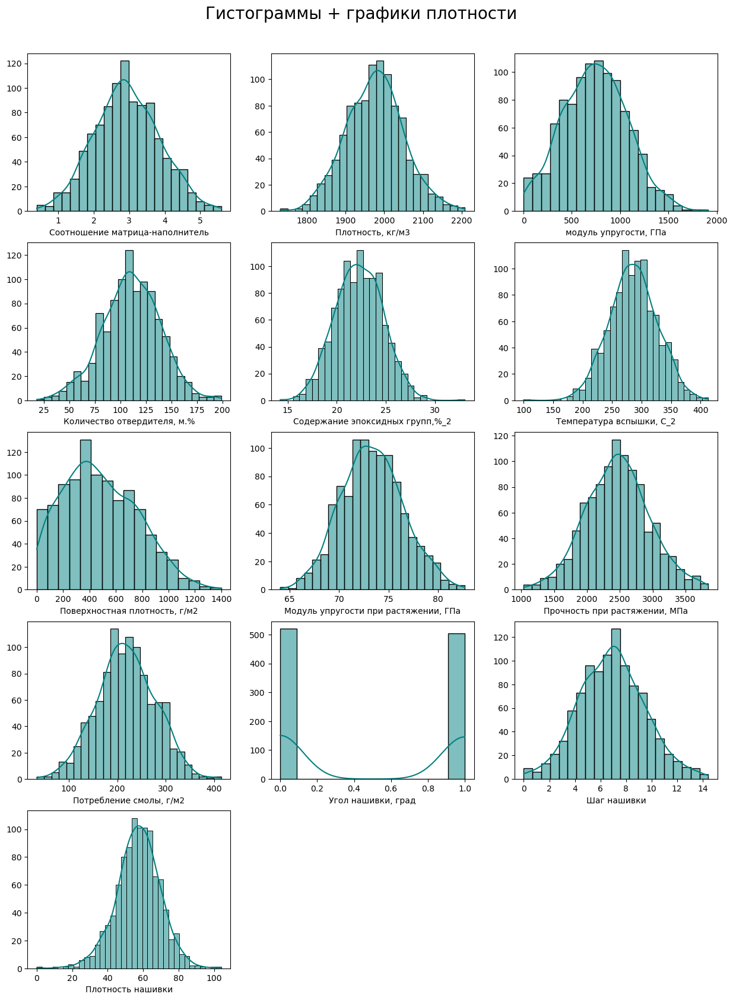

In [23]:
# Гистограммы распределения + графики плотности
n_subplots = len(df.columns)                        
n_cols = 3                                          
n_rows = (n_subplots + n_cols - 1) // n_cols        

plt.figure(figsize=(15,20))
plt.suptitle('Гистограммы + графики плотности', fontsize=20,  y=0.92)
for i, col in enumerate(df.columns, 1):
    plt.subplot(n_rows, n_cols, i)
    sns.histplot(df[col], kde=True, color='teal') 
    plt.ylabel("")
plt.show()

Анализ графиков показывает, что распределения всех параметров (кроме "Угла нашивки" и "Поверхностной плотности, г/м2") стремятся к нормальному. Параметр "Угол нашивки" имеет два значения: 0 и 1, что соответствует величинам 0 и 90 градусов. В дальнейшем целесообразно рассматривать данный признак как категориальный.

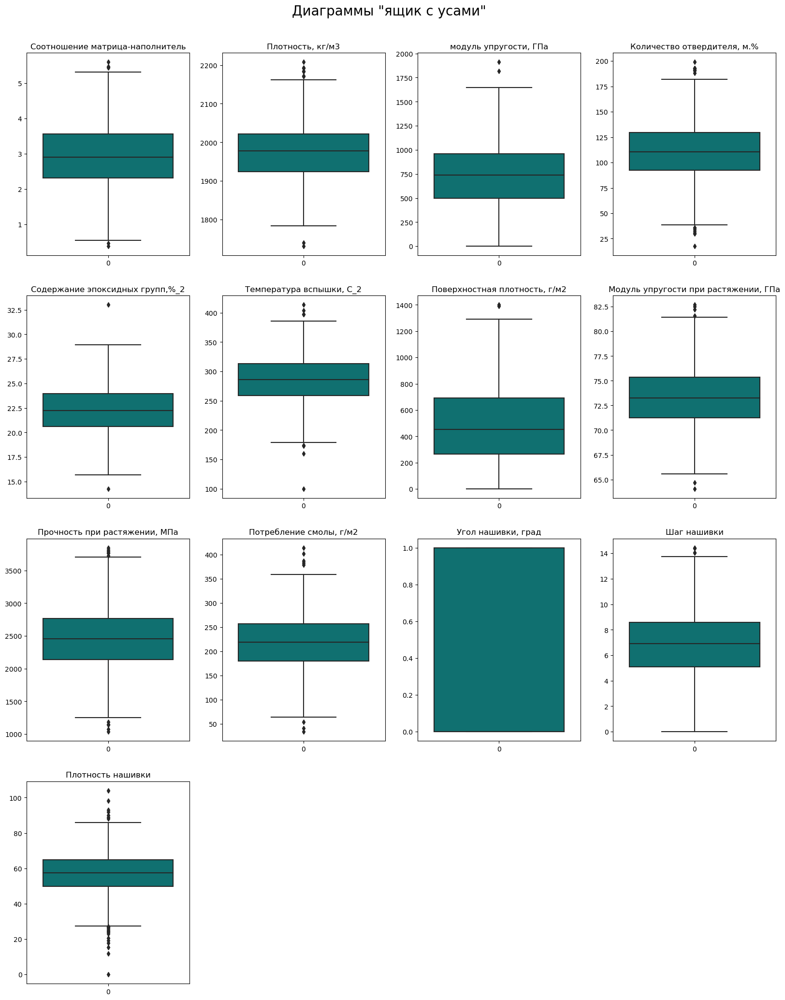

In [24]:
# Диаграммы "ящик с усами"
n_subplots = len(df.columns)                        
n_cols = 4                                          
n_rows = (n_subplots + n_cols - 1) // n_cols        

plt.figure(figsize=(20,25))
plt.suptitle('Диаграммы "ящик с усами"', fontsize=20,  y=0.92)
for i, col in enumerate(df.columns, 1):
    plt.subplot(n_rows, n_cols, i)
    sns.boxplot(data=df[col], color='teal') 
    plt.title(df[col].name, size=12)
plt.show()

Анализируя диаграммы "ящик с усами" видно, что выбросы имеют все характеристики, кроме параметра "Угол нашивки". Необходимо обнаружить и избавиться от выбросов до моделирования набора данных.

<Figure size 2000x2000 with 0 Axes>

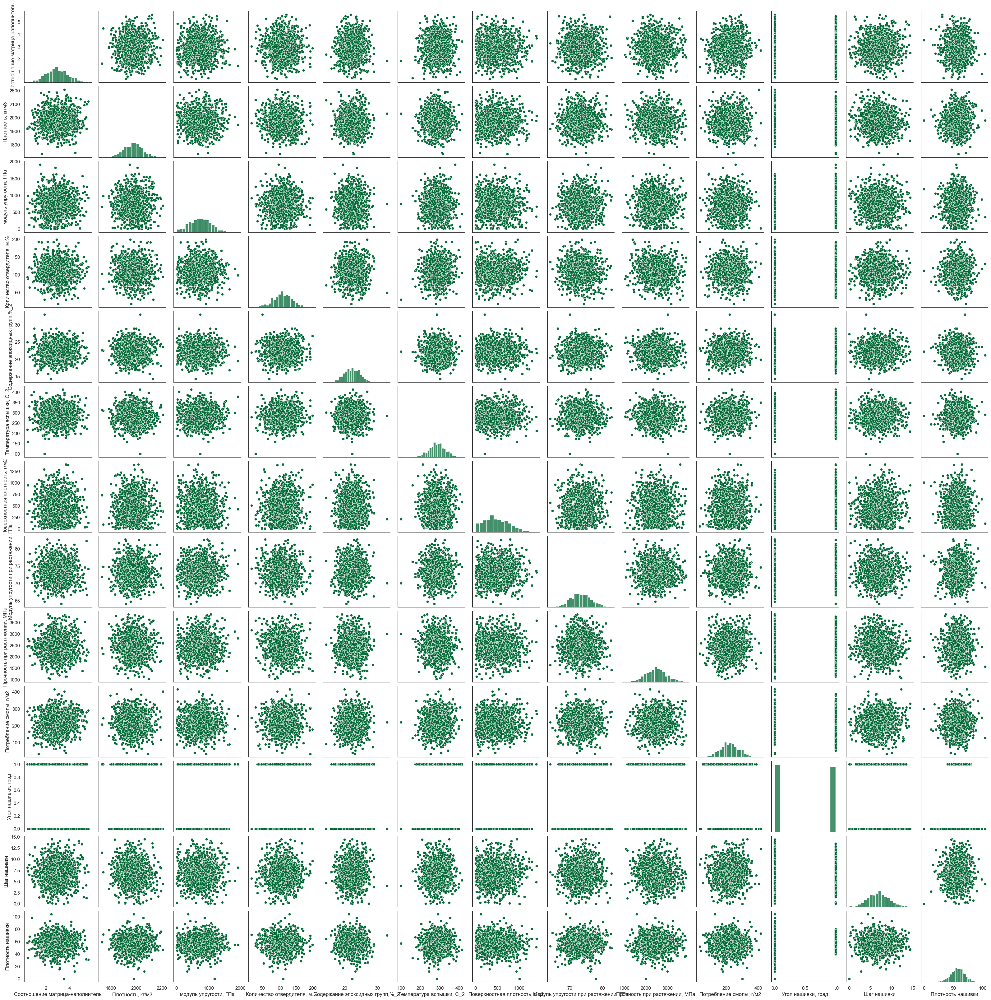

In [25]:
# Попарные графики рассеяния точек с помощью функции sns.pairplot()
plt.figure(figsize=(20,20))
sns.set(style='white', palette='YlGn_r')
sns.pairplot(df)
plt.show()

Анализ приведенных выше графиков свидетельствует об отсутствии линейной зависимости между признаками

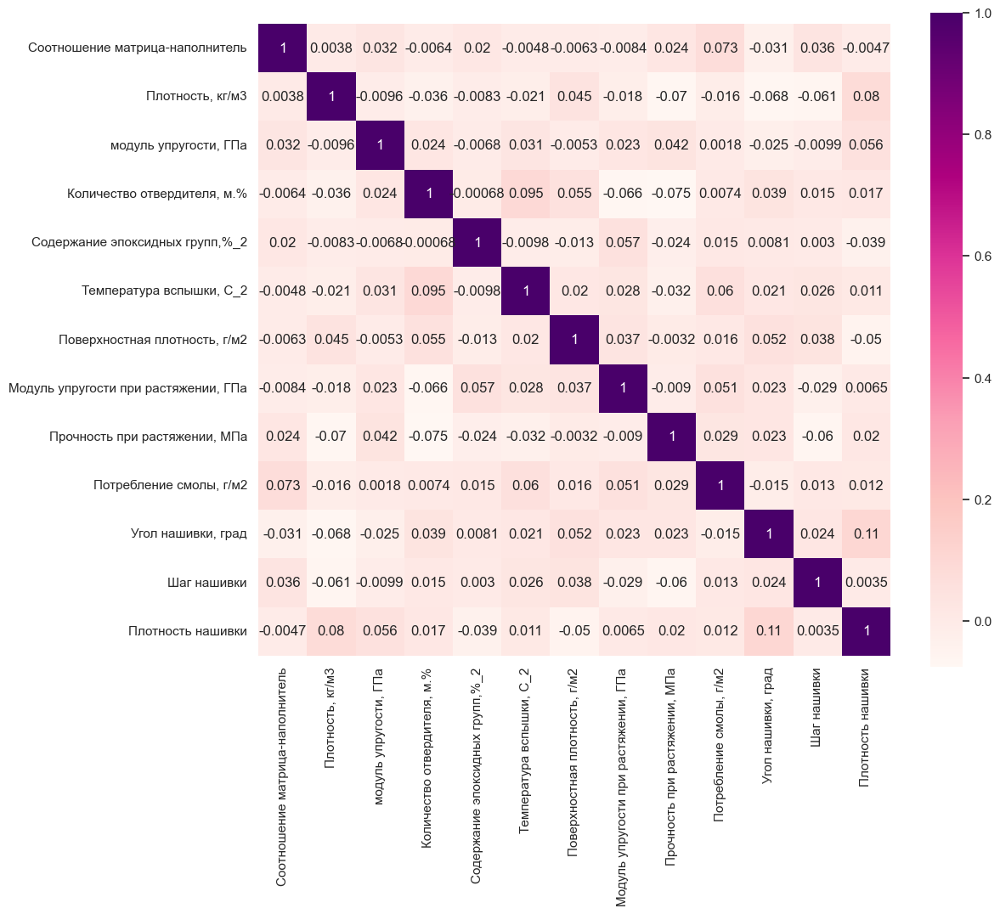

In [26]:
# Визуализация матрицы корреляции в виде тепловой карты
f, ax = plt.subplots(figsize=(12,10))
sns.heatmap(df.corr(), annot=True, ax=ax, square = True, cmap='RdPu')
plt.show()

Вывод: зависимость между всеми параметрами крайне слабая. 
Наибольшая корреляция наблюдается между "Плотностью нашивки" и "Углом нашивки" и равняется 0,11.

## Предобработка данных

In [27]:
# Метод межквартильного диапазона, предварительная оценка кол-ва выбросов 
def detect_outliers_IQR(data):
    outliers = []                          
    Q1 = data.quantile(0.25)                
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR           
    upper_bound = Q3 + 1.5 * IQR          
    for i in data:
        if (i <= lower_bound) | (i >= upper_bound):
            outliers.append(i)
    return outliers

sum_of_outliers = 0                        
for col in df.columns:
    df_outliers_IQR = detect_outliers_IQR(df[col])
    sum_of_outliers += len(df_outliers_IQR)
    print("Выбросов в столбце ", df[col].name, ": ", len(df_outliers_IQR))
print("Итого выбросов: ", sum_of_outliers)

Выбросов в столбце  Соотношение матрица-наполнитель :  6
Выбросов в столбце  Плотность, кг/м3 :  9
Выбросов в столбце  модуль упругости, ГПа :  2
Выбросов в столбце  Количество отвердителя, м.% :  14
Выбросов в столбце  Содержание эпоксидных групп,%_2 :  2
Выбросов в столбце  Температура вспышки, С_2 :  8
Выбросов в столбце  Поверхностная плотность, г/м2 :  2
Выбросов в столбце  Модуль упругости при растяжении, ГПа :  6
Выбросов в столбце  Прочность при растяжении, МПа :  11
Выбросов в столбце  Потребление смолы, г/м2 :  8
Выбросов в столбце  Угол нашивки, град :  0
Выбросов в столбце  Шаг нашивки :  4
Выбросов в столбце  Плотность нашивки :  21
Итого выбросов:  93


In [30]:
# Удалим выбросы, используя копию дататсета для дальнейшей работы
df_clean = df.copy()

idx_outlier_list = []

for col in df_clean.columns:
    df_outliers_IQR = detect_outliers_IQR(df_clean[col])
    idx_outlier = np.where(df_clean[col].isin(df_outliers_IQR))[0] 
    idx_outlier_list.extend(idx_outlier)
   
df_clean = df_clean.drop(idx_outlier_list) 

df_clean.reset_index(drop=True, inplace=True)

df_clean.shape

(936, 13)

In [31]:
# Проверим остались ли в очищенном датасете выбросы
sum_of_outliers_2 = 0                       
for col in df_clean.columns:
    df_outliers_IQR = detect_outliers_IQR(df_clean[col])
    sum_of_outliers_2 += len(df_outliers_IQR)
    print("Выбросов в столбце ", df_clean[col].name, ": ", len(df_outliers_IQR))
print("Итого выбросов: ", sum_of_outliers_2)

Выбросов в столбце  Соотношение матрица-наполнитель :  0
Выбросов в столбце  Плотность, кг/м3 :  0
Выбросов в столбце  модуль упругости, ГПа :  1
Выбросов в столбце  Количество отвердителя, м.% :  0
Выбросов в столбце  Содержание эпоксидных групп,%_2 :  0
Выбросов в столбце  Температура вспышки, С_2 :  0
Выбросов в столбце  Поверхностная плотность, г/м2 :  0
Выбросов в столбце  Модуль упругости при растяжении, ГПа :  1
Выбросов в столбце  Прочность при растяжении, МПа :  4
Выбросов в столбце  Потребление смолы, г/м2 :  1
Выбросов в столбце  Угол нашивки, град :  0
Выбросов в столбце  Шаг нашивки :  0
Выбросов в столбце  Плотность нашивки :  3
Итого выбросов:  10


In [32]:
# Повторно используем метод межквартильных интервалов на очищеной выборке (т.к. осталось еще 10 выбросов)

idx_outlier_list_2 = []

for col in df_clean.columns:
    df_outliers_IQR = detect_outliers_IQR(df_clean[col])
    idx_outlier = np.where(df_clean[col].isin(df_outliers_IQR))[0] 
    idx_outlier_list_2.extend(idx_outlier)
   
df_clean = df_clean.drop(idx_outlier_list_2) 

df_clean.reset_index(drop=True, inplace=True)

df_clean.shape

(926, 13)

In [33]:
# Проверим остались ли в очищенном датасете выбросы
sum_of_outliers_3 = 0                        
for col in df_clean.columns:
    df_outliers_IQR = detect_outliers_IQR(df_clean[col])
    sum_of_outliers_3 += len(df_outliers_IQR)
    print("Выбросов в столбце ", df_clean[col].name, ": ", len(df_outliers_IQR))
print("Итого выбросов: ", sum_of_outliers_3)

Выбросов в столбце  Соотношение матрица-наполнитель :  0
Выбросов в столбце  Плотность, кг/м3 :  0
Выбросов в столбце  модуль упругости, ГПа :  0
Выбросов в столбце  Количество отвердителя, м.% :  0
Выбросов в столбце  Содержание эпоксидных групп,%_2 :  0
Выбросов в столбце  Температура вспышки, С_2 :  0
Выбросов в столбце  Поверхностная плотность, г/м2 :  0
Выбросов в столбце  Модуль упругости при растяжении, ГПа :  0
Выбросов в столбце  Прочность при растяжении, МПа :  2
Выбросов в столбце  Потребление смолы, г/м2 :  1
Выбросов в столбце  Угол нашивки, град :  0
Выбросов в столбце  Шаг нашивки :  0
Выбросов в столбце  Плотность нашивки :  1
Итого выбросов:  4


In [34]:
# Повторно используем метод межквартильных интервалов на очищеной выборке (т.к. осталось еще 4 выброса)

idx_outlier_list_3 = []

for col in df_clean.columns:
    df_outliers_IQR = detect_outliers_IQR(df_clean[col])
    idx_outlier = np.where(df_clean[col].isin(df_outliers_IQR))[0] 
    idx_outlier_list_3.extend(idx_outlier)

df_clean = df_clean.drop(idx_outlier_list_3) 

df_clean.reset_index(drop=True, inplace=True)

df_clean.shape

(922, 13)

In [35]:
sum_of_outliers_4 = 0                        
for col in df_clean.columns:
    df_outliers_IQR = detect_outliers_IQR(df_clean[col])
    sum_of_outliers_4 += len(df_outliers_IQR)
    print("Выбросов в столбце ", df_clean[col].name, ": ", len(df_outliers_IQR))
print("Итого выбросов: ", sum_of_outliers_4)

Выбросов в столбце  Соотношение матрица-наполнитель :  0
Выбросов в столбце  Плотность, кг/м3 :  0
Выбросов в столбце  модуль упругости, ГПа :  0
Выбросов в столбце  Количество отвердителя, м.% :  0
Выбросов в столбце  Содержание эпоксидных групп,%_2 :  0
Выбросов в столбце  Температура вспышки, С_2 :  0
Выбросов в столбце  Поверхностная плотность, г/м2 :  0
Выбросов в столбце  Модуль упругости при растяжении, ГПа :  0
Выбросов в столбце  Прочность при растяжении, МПа :  0
Выбросов в столбце  Потребление смолы, г/м2 :  0
Выбросов в столбце  Угол нашивки, град :  0
Выбросов в столбце  Шаг нашивки :  0
Выбросов в столбце  Плотность нашивки :  0
Итого выбросов:  0


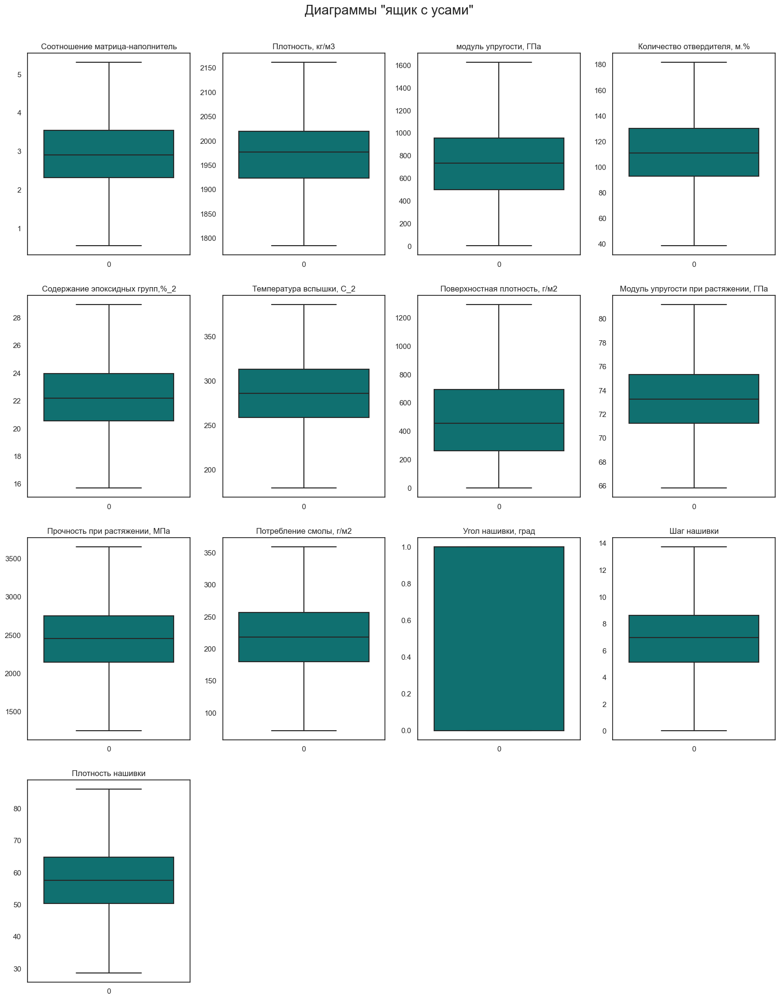

In [37]:
# Визуализируем очищенный датасет с помощью диаграмм "ящик с усами"
n_subplots = len(df_clean.columns)                        
n_cols = 4                                                
n_rows = (n_subplots + n_cols - 1) // n_cols              

plt.figure(figsize=(20,25))
plt.suptitle('Диаграммы "ящик с усами"', fontsize=20,  y=0.92)
for i, col in enumerate(df_clean.columns, 1):
    plt.subplot(n_rows, n_cols, i)
    sns.boxplot(data=df_clean[col], color='teal') 
    plt.title(df_clean[col].name, size=12)
plt.show()

Вывод: выбросы из данных удалены после трех этапов очистки.

### Нормализация и стандартизация данных

In [38]:
# Посмотрим статистические характеристики датасета после удаления выбросов
df_clean.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000
mean,2.927964,1974.118744,736.119982,111.136066,22.200570,286.181128,482.429070,73.303464,2461.491315,218.048059,0.510846,6.931939,57.562887
std,0.895472,71.040648,327.607008,26.753228,2.393926,39.420764,280.437329,3.025864,453.564734,57.137475,0.500154,2.514184,11.122204
min,0.547391,1784.482245,2.436909,38.668500,15.695894,179.374391,0.603740,65.793845,1250.392802,72.530873,0.000000,0.037639,28.661632
25%,2.320191,1923.318006,498.538615,92.856591,20.556328,259.205321,264.345872,71.241213,2148.175736,179.875097,0.000000,5.143644,50.275385
50%,2.907832,1977.321002,736.178435,111.162090,22.177681,286.220763,457.732246,73.247594,2455.974462,218.697660,1.000000,6.972862,57.584225
75%,3.549367,2020.053266,956.955626,130.109815,23.956980,313.012786,695.531920,75.310130,2751.233766,256.623860,1.000000,8.612094,64.840898
max,5.314144,2161.565216,1628.000000,181.828448,28.955094,386.067992,1291.340115,81.203147,3654.434359,359.052220,1.000000,13.732404,86.012427


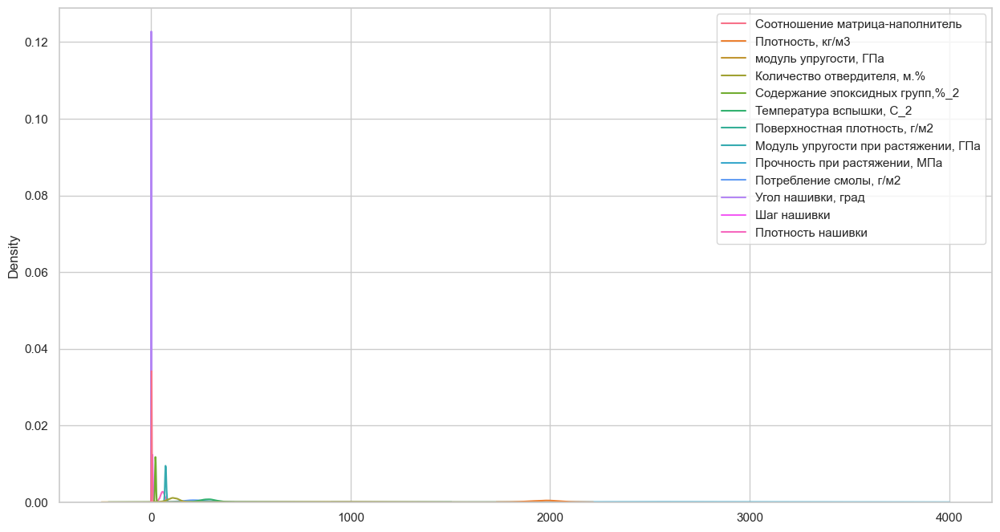

In [39]:
# Построим графики распределения всех параметров
plt.figure(figsize=(15,8))
sns.set(context='notebook', style='whitegrid')
sns.kdeplot(data=df_clean)
plt.show()

Графики выше показывают, что численные признаки датасета разных масштабов.

In [40]:
# Выведем отдельно средние и медианы по столбцам и проанализируем эти значения
mean_median = pd.DataFrame({'Среднее': df_clean.mean(axis=0),
                            'Медиана': df_clean.median(axis=0),
                            'Разница м/у средним и медианой': df_clean.mean(axis=0) - df_clean.median(axis=0),
                            'Разница м/у средним и медианой, %': ((df_clean.mean(axis=0) - df_clean.median(axis=0)) / df_clean.median(axis=0)) * 100})
mean_median

,Среднее,Медиана,Разница м/у средним и медианой,"Разница м/у средним и медианой, %"
Соотношение матрица-наполнитель,2.927964,2.907832,0.020132,0.692327
"Плотность, кг/м3",1974.118744,1977.321002,-3.202258,-0.161949
"модуль упругости, ГПа",736.119982,736.178435,-0.058453,-0.007940
"Количество отвердителя, м.%",111.136066,111.162090,-0.026024,-0.023411
"Содержание эпоксидных групп,%_2",22.200570,22.177681,0.022889,0.103207
"Температура вспышки, С_2",286.181128,286.220763,-0.039636,-0.013848
"Поверхностная плотность, г/м2",482.429070,457.732246,24.696824,5.395474
"Модуль упругости при растяжении, ГПа",73.303464,73.247594,0.055870,0.076276
"Прочность при растяжении, МПа",2461.491315,2455.974462,5.516853,0.224630
"Потребление смолы, г/м2",218.048059,218.697660,-0.649600,-0.297031


Медиана и среднее в очищенной выборке откличатся не существенно, кроме столбцов "Поверхностная плотность, г/м2" и "Угол нашивки".

In [41]:
# Проведем тест Шапиро-Уилка на нормальность
for col in df_clean.columns:
    print(df_clean[col].name, shapiro(df_clean[col]))

Соотношение матрица-наполнитель ShapiroResult(statistic=0.9971880316734314, pvalue=0.10904344916343689)
Плотность, кг/м3 ShapiroResult(statistic=0.997011661529541, pvalue=0.08352091163396835)
модуль упругости, ГПа ShapiroResult(statistic=0.995254397392273, pvalue=0.0058130305260419846)
Количество отвердителя, м.% ShapiroResult(statistic=0.9966756105422974, pvalue=0.05000615119934082)
Содержание эпоксидных групп,%_2 ShapiroResult(statistic=0.9977133870124817, pvalue=0.23541033267974854)
Температура вспышки, С_2 ShapiroResult(statistic=0.9971266984939575, pvalue=0.09941922873258591)
Поверхностная плотность, г/м2 ShapiroResult(statistic=0.9776217937469482, pvalue=1.0688074730813568e-10)
Модуль упругости при растяжении, ГПа ShapiroResult(statistic=0.9955782890319824, pvalue=0.009416559711098671)
Прочность при растяжении, МПа ShapiroResult(statistic=0.9973730444908142, pvalue=0.14375117421150208)
Потребление смолы, г/м2 ShapiroResult(statistic=0.9955164790153503, pvalue=0.008584197610616684

Вывод: по результатам теста распределение не является нормальным, т.к. нулевая гипотеза отвергается (p-value < 0.05) в случаях:
 - модуль упругости, ГПа
 - Поверхностная плотность, г/м2
 - Модуль упругости при растяжении, ГПа
 - Потребление смолы, г/м2 
 - Угол нашивки

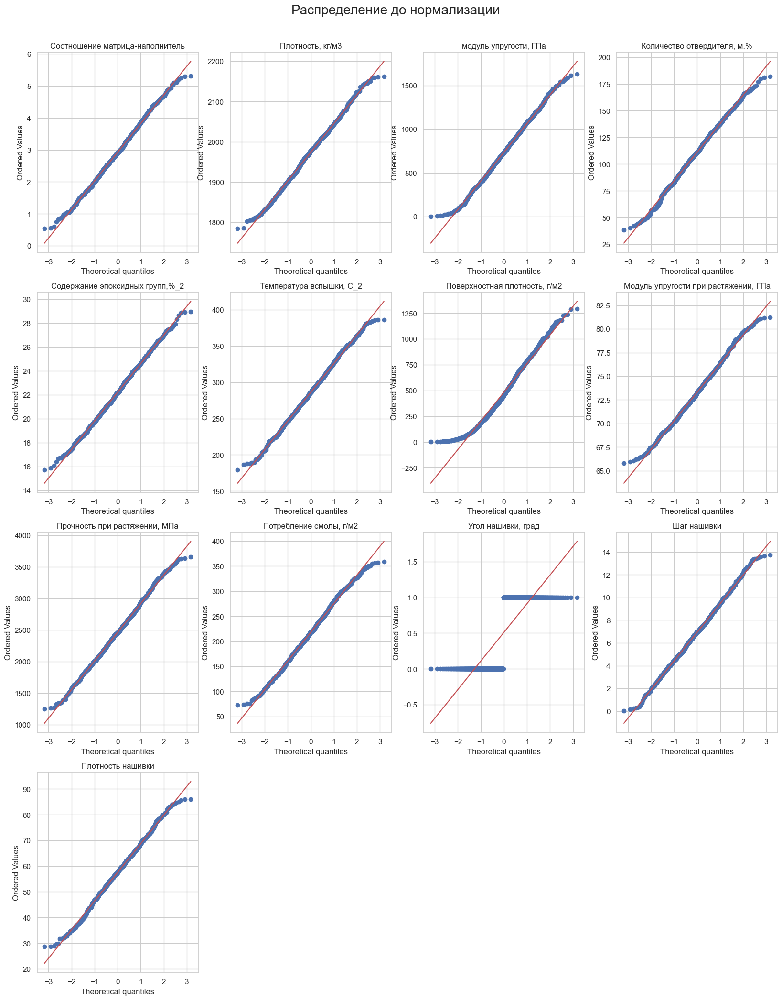

In [44]:
# Проведем дополнительную оценку нормальности распределения на основе графиков. 
# Ранее уже строили гистограммы распределения, по которым видно, что по большинству параметров распределение похоже на нормальное
# Дополнительно оценим нормальность распределения при помощи QQ-графиков

n_subplots = len(df_clean.columns)                        
n_cols = 4                                               
n_rows = (n_subplots + n_cols - 1) // n_cols              

plt.figure(figsize=(20,25))
plt.suptitle('Распределение до нормализации', fontsize=20,  y=0.92)
for i, col in enumerate(df_clean.columns, 1):
    plt.subplot(n_rows, n_cols, i)
    stats.probplot(df_clean[col], dist='norm', plot=plt)
    plt.title(df_clean[col].name, size=12)
plt.show()

Из графиков видно, что большинство данных близки к нормальному распределению, которое на данном графике представляет красная линия.

In [45]:
# Нормализация данных при помощи метода MinMaxScaler
minmax_scl = MinMaxScaler()                                                             
dataset_norm_minmax = minmax_scl.fit_transform(np.array(df_clean[df_clean.columns]))    
df_norm_minmax = pd.DataFrame(data = dataset_norm_minmax, columns = df_clean.columns)   
df_norm_minmax.describe()                                                               

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000
mean,0.499412,0.502904,0.451341,0.506200,0.490578,0.516739,0.373295,0.487343,0.503776,0.507876,0.510846,0.503426,0.503938
std,0.187858,0.188395,0.201534,0.186876,0.180548,0.190721,0.217269,0.196366,0.188668,0.199418,0.500154,0.183587,0.193933
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.371909,0.368184,0.305188,0.378514,0.366571,0.386228,0.204335,0.353512,0.373447,0.374647,0.000000,0.372844,0.376869
50%,0.495189,0.511396,0.451377,0.506382,0.488852,0.516931,0.354161,0.483718,0.501481,0.510143,1.000000,0.506414,0.504310
75%,0.629774,0.624719,0.587193,0.638735,0.623046,0.646553,0.538397,0.617568,0.624299,0.642511,1.000000,0.626112,0.630842
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


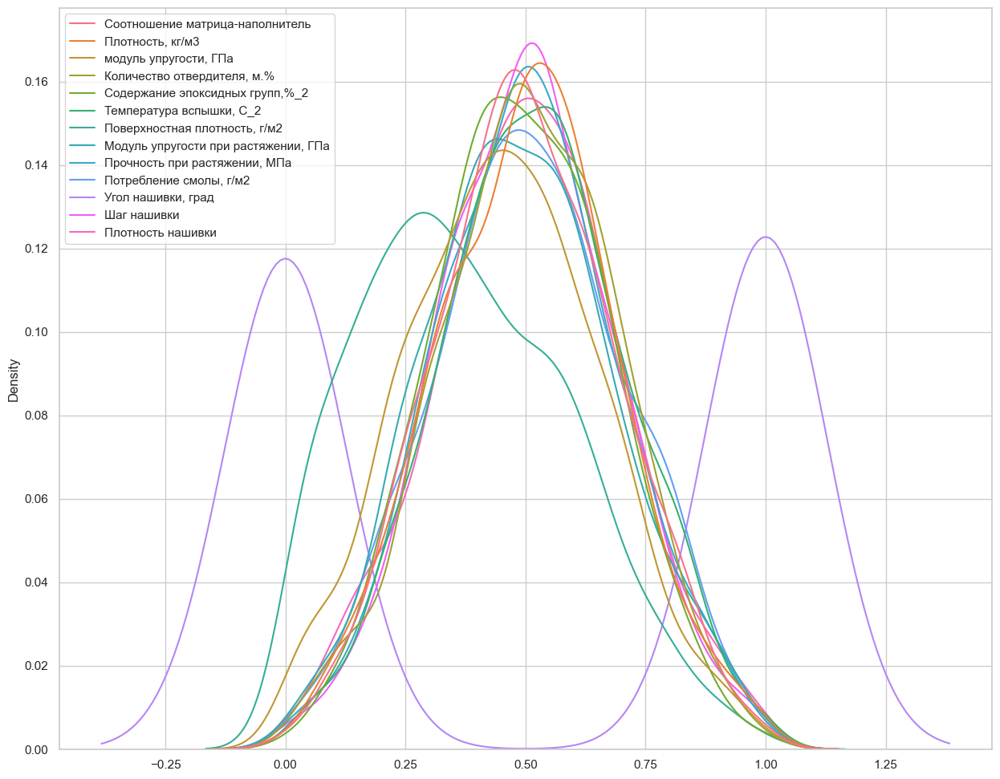

In [46]:
# Визуализируем полученный результат
plt.figure(figsize=(15,12))
sns.set(context='notebook', style='whitegrid')
sns.kdeplot(data=df_norm_minmax)
plt.show()

Результат: все параметры имеют одинаковый относительный масштаб. Относительные пробелы между значениями каждого объекта были сохранены. Максимальное значение признака равно 1, минимальное - 0.

In [47]:
# Для создания приложения для прогнозирования характеристик композитных материалов создадим масштабаторы
minmax_scl_x = MinMaxScaler()
minmax_scl_y = MinMaxScaler()  

# Зададим x и y для нейронной сети
X = df_clean.drop(['Соотношение матрица-наполнитель'], axis = 1)
y = df_clean[['Соотношение матрица-наполнитель']]

# Обучим масштабаторы для x и y
minmax_scl_x.fit(X.values)
minmax_scl_y.fit(y.values)

# Сохраним масштабаторы 
dump(minmax_scl_x, 'minmax_scl_x.pkl')
dump(minmax_scl_y, 'minmax_scl_y.pkl')

['minmax_scl_y.pkl']

In [48]:
a = df_clean.drop(['Соотношение матрица-наполнитель'], axis = 1)
a.shape

(922, 12)

In [49]:
# Нормализация при помощи метода RobustScaler
robust_scl = RobustScaler()                                                               
dataset_norm_robust = robust_scl.fit_transform(np.array(df_clean[df_clean.columns]))      
df_norm_robust = pd.DataFrame(data = dataset_norm_robust, columns = df_clean.columns)     
df_norm_robust.describe()                                                                 

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,922.000000,922.000000,9.220000e+02,922.000000,9.220000e+02,922.000000,922.000000,922.000000,9.220000e+02,9.220000e+02,922.000000,922.000000,9.220000e+02
mean,0.016378,-0.033103,-1.275099e-04,-0.000699,6.730776e-03,-0.000737,0.057276,0.013731,9.148130e-03,-8.463985e-03,-0.489154,-0.011799,-1.464983e-03
std,0.728514,0.734382,7.146485e-01,0.718145,7.039609e-01,0.732626,0.650386,0.743654,7.521079e-01,7.444742e-01,0.500154,0.724872,7.635986e-01
min,-1.920345,-1.993469,-1.600598e+00,-1.945968,-1.906042e+00,-1.985717,-1.060165,-1.831876,-1.999114e+00,-1.904484e+00,-1.000000,-1.999517,-1.985690e+00
25%,-0.478077,-0.558256,-5.183922e-01,-0.491380,-4.767770e-01,-0.502076,-0.448499,-0.493100,-5.103965e-01,-5.058396e-01,-1.000000,-0.527388,-5.017908e-01
50%,0.000000,0.000000,1.240327e-16,0.000000,-5.223686e-16,0.000000,0.000000,0.000000,-3.770855e-16,1.851817e-16,0.000000,0.000000,-2.439455e-16
75%,0.521923,0.441744,4.816078e-01,0.508620,5.232230e-01,0.497924,0.551501,0.506900,4.896035e-01,4.941604e-01,0.000000,0.472612,4.982092e-01
max,1.957663,1.904623,1.945437e+00,1.896919,1.992975e+00,1.855639,1.933290,1.955202,1.987304e+00,1.828753e+00,0.000000,1.948866,1.951747e+00


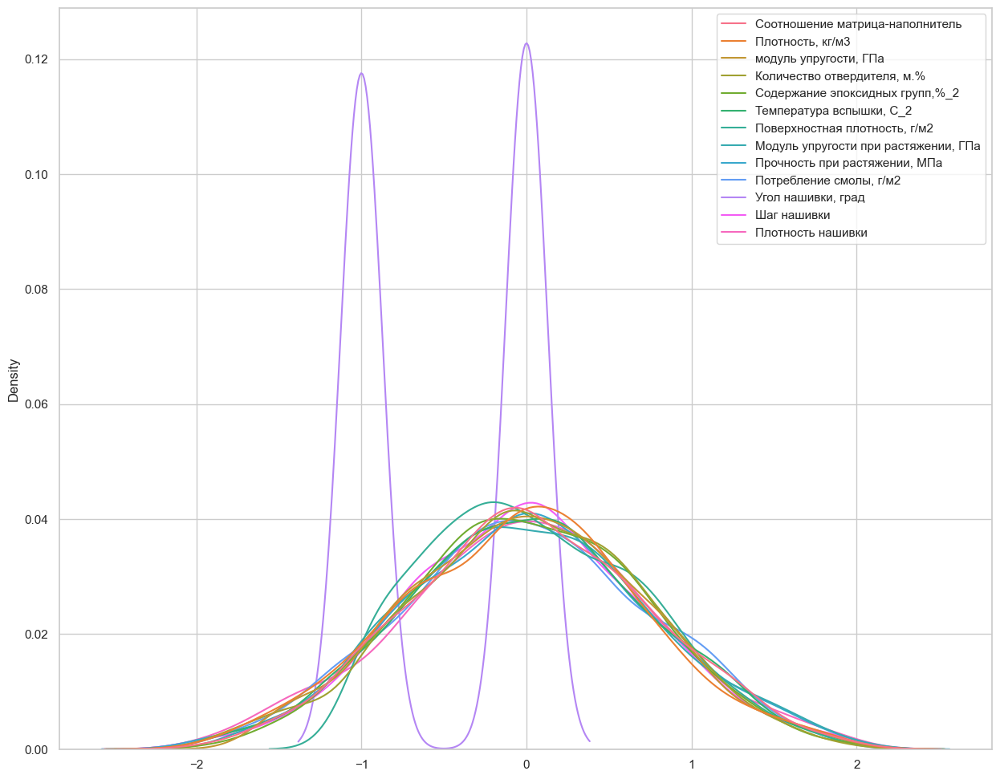

In [50]:
# Визуализируем полученный результат
plt.figure(figsize=(15,12))
sns.set(context='notebook', style='whitegrid')
sns.kdeplot(data=df_norm_robust)
plt.show()

Результат: после использования RobustScaler() данные приняли отрицательные значения. Средние значения находятся в районе 0. Максимальное значение параметров находится в районе 2, минимальное - в районе -2.

In [51]:
# Стандартизация при помощи метода StandardScaler
std_scl = StandardScaler()                                                              
dataset_norm_std = std_scl.fit_transform(np.array(df_clean[df_clean.columns]))          
df_norm_std = pd.DataFrame(data = dataset_norm_std, columns = df_clean.columns)         
df_norm_std.describe()                                                                  

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,9.220000e+02,9.220000e+02,9.220000e+02,9.220000e+02,9.220000e+02,9.220000e+02,9.220000e+02,9.220000e+02,9.220000e+02,9.220000e+02,9.220000e+02,9.220000e+02,9.220000e+02
mean,-7.959408e-17,-1.757813e-15,2.118094e-16,2.564832e-16,8.429025e-17,-4.172367e-17,1.866427e-17,-4.028773e-15,-7.823339e-16,-2.174688e-16,-1.272783e-15,-1.179461e-16,-1.027378e-15
std,1.000543e+00,1.000543e+00,1.000543e+00,1.000543e+00,1.000543e+00,1.000543e+00,1.000543e+00,1.000543e+00,1.000543e+00,1.000543e+00,1.000543e+00,1.000543e+00,1.000543e+00
min,-2.659900e+00,-2.670857e+00,-2.240737e+00,-2.710211e+00,-2.718633e+00,-2.710874e+00,-1.719054e+00,-2.483157e+00,-2.671627e+00,-2.548173e+00,-1.021932e+00,-2.743651e+00,-2.599929e+00
25%,-6.790861e-01,-7.154821e-01,-7.255959e-01,-6.836332e-01,-6.872118e-01,-6.846759e-01,-7.780760e-01,-6.819110e-01,-6.911596e-01,-6.684524e-01,-1.021932e+00,-7.116685e-01,-6.555766e-01
50%,-2.249388e-02,4.510088e-02,1.785201e-04,9.732731e-04,-9.566481e-03,1.005999e-03,-8.811319e-02,-1.847416e-02,-1.216992e-02,1.137525e-02,9.785383e-01,1.628558e-02,1.919567e-03
75%,6.943159e-01,6.469458e-01,6.744529e-01,7.095984e-01,7.340927e-01,6.810173e-01,7.603072e-01,6.635309e-01,6.391584e-01,6.755065e-01,9.785383e-01,6.686332e-01,6.547228e-01
max,2.666164e+00,2.640013e+00,2.723886e+00,2.643821e+00,2.823057e+00,2.535239e+00,2.886028e+00,2.612136e+00,2.631577e+00,2.469145e+00,9.785383e-01,2.706308e+00,2.559293e+00


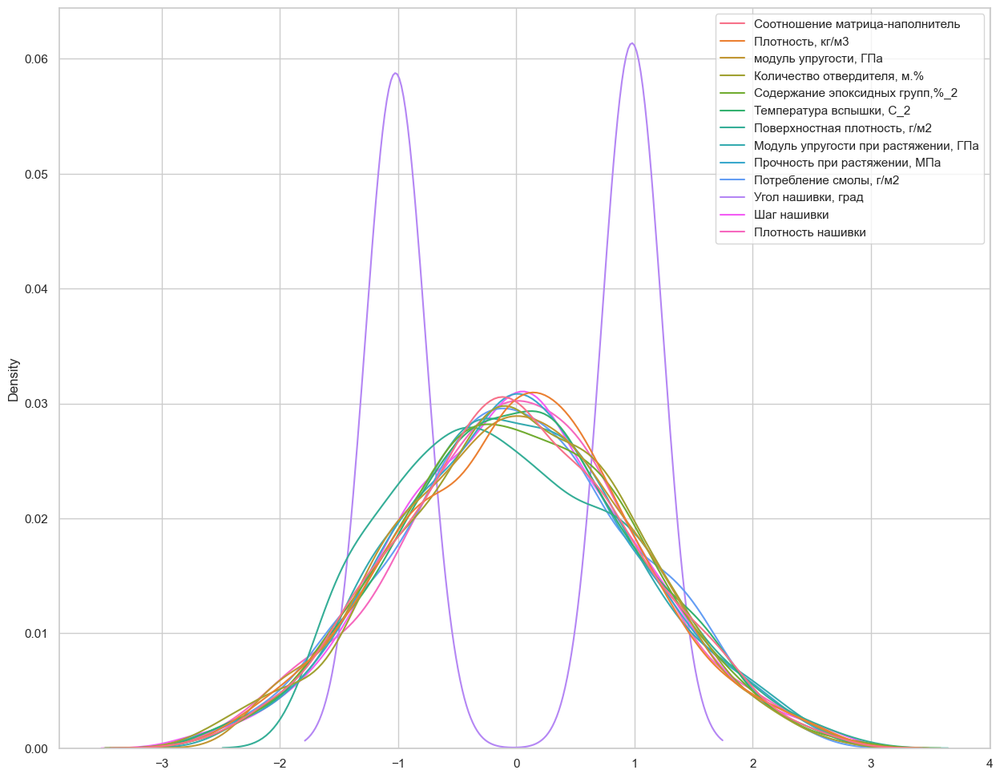

In [52]:
# Визуализируем полученный результат
plt.figure(figsize=(15,12))
sns.set(context='notebook', style='whitegrid')
sns.kdeplot(data=df_norm_std)
plt.show()

Результат: у всех распределений среднее равно нулю и единичная дисперсия. Максимальное значение параметров находится в районе 3, минимальное -  в районе -3.

In [53]:
# Преобразование с помощью Normalizer
normalize = Normalizer()                                                                            
dataset_norm_normalizer = normalize.fit_transform(np.array(df_norm_minmax[df_norm_minmax.columns])) 
df_norm_normalizer = pd.DataFrame(data = dataset_norm_normalizer, columns = df_norm_minmax.columns) 
df_norm_normalizer.describe()                                                                      

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000
mean,0.257826,0.260766,0.232659,0.261797,0.253591,0.266653,0.191569,0.251385,0.260907,0.261720,0.248030,0.260017,0.259149
std,0.094072,0.097385,0.102114,0.095110,0.092344,0.095951,0.109361,0.098591,0.097229,0.100080,0.244429,0.093712,0.098338
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.195775,0.191248,0.163413,0.197690,0.190283,0.200663,0.108216,0.181112,0.196715,0.195002,0.000000,0.201442,0.192792
50%,0.259166,0.260873,0.231372,0.263703,0.252287,0.265188,0.184998,0.251656,0.259117,0.263073,0.414600,0.259017,0.259595
75%,0.325115,0.328747,0.305227,0.331158,0.316076,0.332639,0.271430,0.318993,0.329162,0.328578,0.482933,0.318151,0.322414
max,0.564813,0.522069,0.522787,0.543068,0.531648,0.507854,0.552173,0.550966,0.590885,0.576162,0.658865,0.567565,0.592974


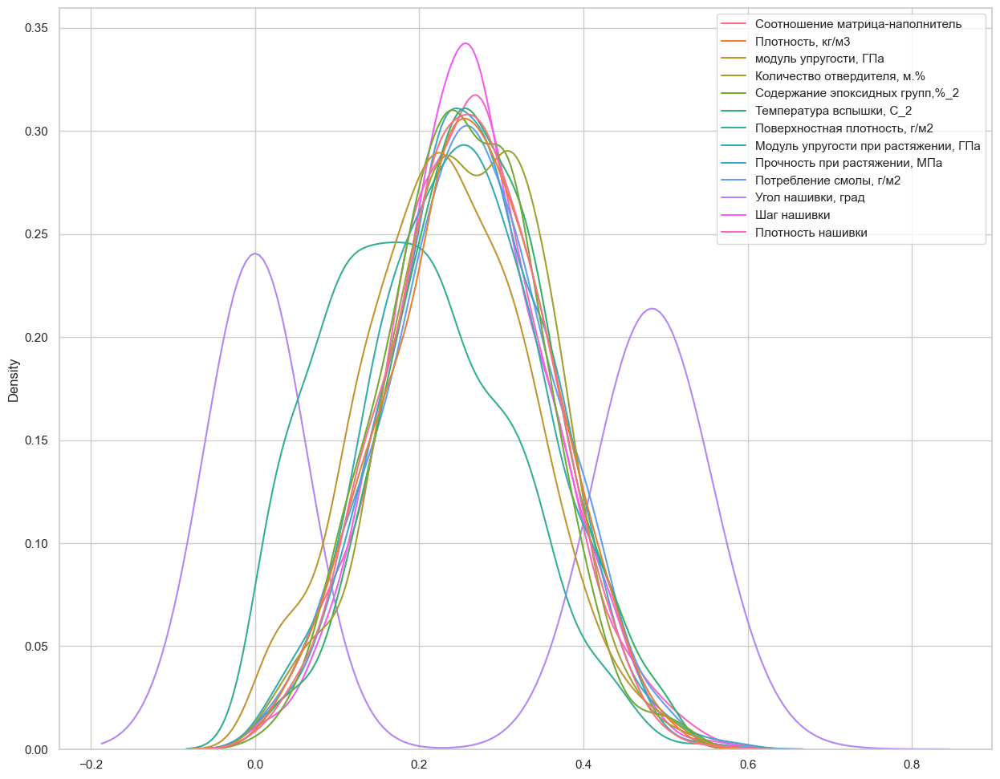

In [54]:
# Визуализируем полученный результат
plt.figure(figsize=(15,12))
sns.set(context='notebook', style='whitegrid')
sns.kdeplot(data=df_norm_normalizer)
plt.show()

Результат: значения после стандартизации находятся в диапазоне от 0 до 1.

In [55]:
# Преобразование Йео-Джонсона из метода PowerTransformer()
yeo = PowerTransformer(method='yeo-johnson', standardize=True)                          
dataset_norm_yeo = yeo.fit_transform(np.array(df_clean[df_clean.columns]))              
df_norm_yeo = pd.DataFrame(data = dataset_norm_yeo, columns = df_clean.columns)         
df_norm_yeo.describe()                                                                  

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,9.220000e+02,9.220000e+02,9.220000e+02,9.220000e+02,9.220000e+02,9.220000e+02,9.220000e+02,9.220000e+02,9.220000e+02,9.220000e+02,9.220000e+02,9.220000e+02,9.220000e+02
mean,-5.045374e-17,-1.544920e-15,-2.686451e-16,-1.901347e-16,-8.323060e-16,-4.377072e-17,-4.443300e-17,2.052769e-14,-1.552145e-16,3.186172e-16,-1.274709e-15,-1.112029e-16,-2.157830e-16
std,1.000543e+00,1.000543e+00,1.000543e+00,1.000543e+00,1.000543e+00,1.000543e+00,1.000543e+00,1.000543e+00,1.000543e+00,1.000543e+00,1.000543e+00,1.000543e+00,1.000543e+00
min,-2.767889e+00,-2.675708e+00,-2.513112e+00,-2.604888e+00,-2.795257e+00,-2.733083e+00,-2.387515e+00,-2.620347e+00,-2.747470e+00,-2.583828e+00,-1.021932e+00,-2.841821e+00,-2.577907e+00
25%,-6.699407e-01,-7.150902e-01,-6.963250e-01,-6.940707e-01,-6.811185e-01,-6.827710e-01,-6.954159e-01,-6.696717e-01,-6.848027e-01,-6.647379e-01,-1.021932e+00,-7.045494e-01,-6.579290e-01
50%,-8.529465e-03,4.586944e-02,3.534853e-02,-1.335891e-02,1.171887e-03,4.132026e-03,3.559536e-02,5.497152e-03,-1.846912e-03,1.653428e-02,9.785383e-01,2.622876e-02,-1.458918e-03
75%,7.001159e-01,6.473802e-01,6.852768e-01,7.049707e-01,7.386407e-01,6.824725e-01,7.913927e-01,6.774945e-01,6.444365e-01,6.776027e-01,9.785383e-01,6.725164e-01,6.531693e-01
max,2.592976e+00,2.635512e+00,2.549303e+00,2.723799e+00,2.754981e+00,2.519473e+00,2.350242e+00,2.485302e+00,2.577432e+00,2.445652e+00,9.785383e-01,2.653187e+00,2.576665e+00


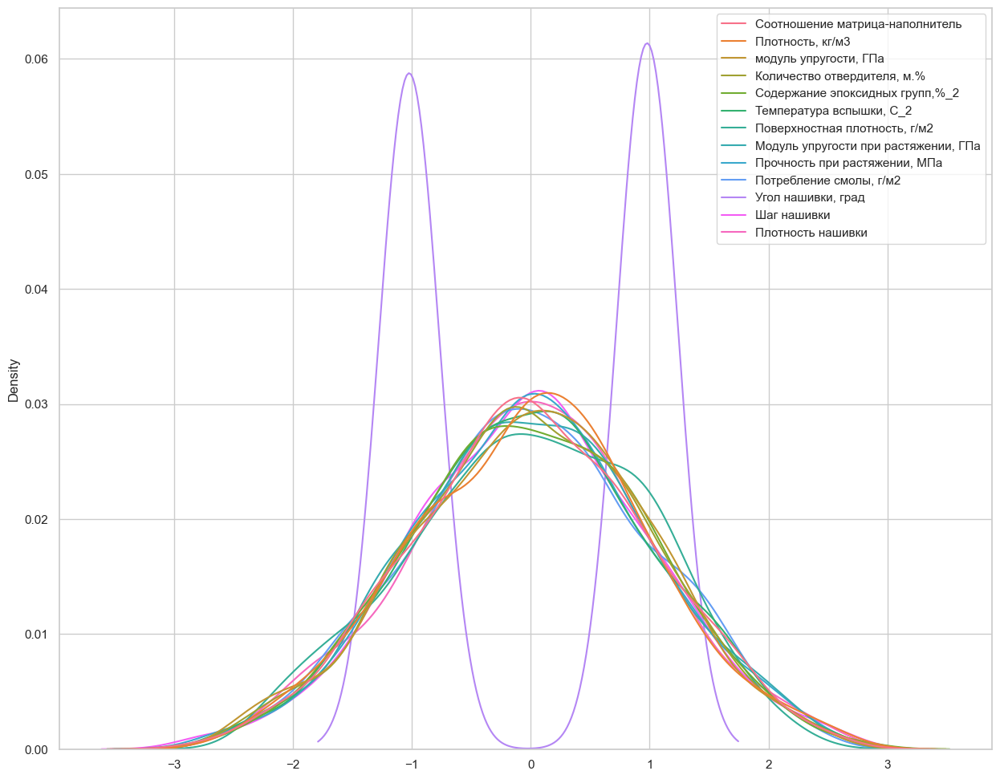

In [56]:
# Визуализируем полученный результат
plt.figure(figsize=(15,12))
sns.set(context='notebook', style='whitegrid')
sns.kdeplot(data=df_norm_yeo)
plt.show()

Результат: средние значения находятся в районе 0. Максимальное значение параметров находится в районе 3, минимальное - в районе -3.

#### Проверка на нормальность после нормализации с использованием метода MinMaxScaler

In [57]:
# Тест Шапиро-Уилка на нормальность
for col in df_norm_minmax.columns:
    print(df_norm_minmax[col].name, shapiro(df_norm_minmax[col]))

Соотношение матрица-наполнитель ShapiroResult(statistic=0.9971882104873657, pvalue=0.10907094180583954)
Плотность, кг/м3 ShapiroResult(statistic=0.997011661529541, pvalue=0.08352091163396835)
модуль упругости, ГПа ShapiroResult(statistic=0.9952542185783386, pvalue=0.005811706185340881)
Количество отвердителя, м.% ShapiroResult(statistic=0.9966757893562317, pvalue=0.050019025802612305)
Содержание эпоксидных групп,%_2 ShapiroResult(statistic=0.9977133870124817, pvalue=0.23541033267974854)
Температура вспышки, С_2 ShapiroResult(statistic=0.9971266984939575, pvalue=0.09941922873258591)
Поверхностная плотность, г/м2 ShapiroResult(statistic=0.9776219129562378, pvalue=1.0689168300492824e-10)
Модуль упругости при растяжении, ГПа ShapiroResult(statistic=0.9955782890319824, pvalue=0.009416559711098671)
Прочность при растяжении, МПа ShapiroResult(statistic=0.9973730444908142, pvalue=0.14375117421150208)
Потребление смолы, г/м2 ShapiroResult(statistic=0.995516300201416, pvalue=0.008582196198403835

Результаты теста после нормализации по-прежнему показывают, что распределение не является нормальным. После стандартизации нулевая гипотеза отвергается (p-value < 0.05) в случаях:
 - модуль упругости, ГПа
 - Поверхностная плотность, г/м2
 - Модуль упругости при растяжении, ГПа
 - Потребление смолы, г/м2
 - Угол нашивки

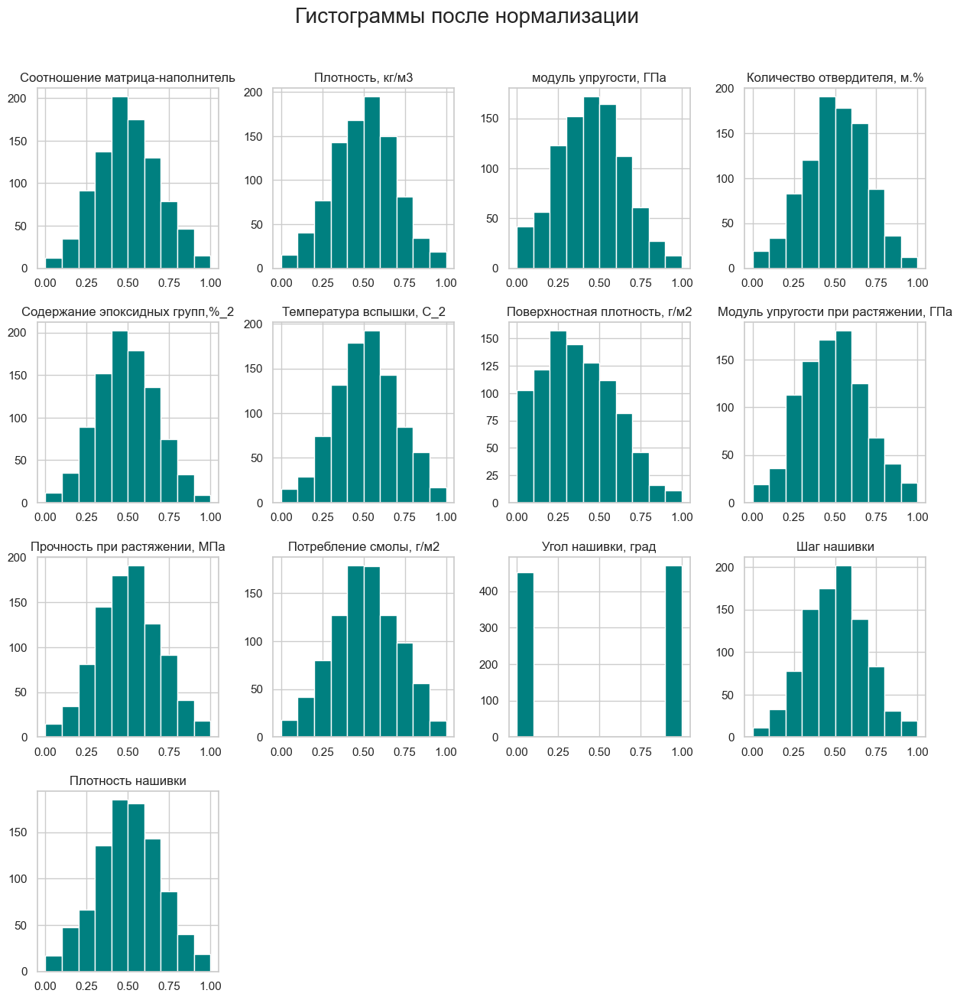

In [58]:
# Гистограммы расределения после нормализации
df_norm_minmax.hist(figsize = (15,15), color = 'teal')
plt.suptitle('Гистограммы после нормализации', fontsize=20,  y=0.95)
plt.show()

Результат: после нормализации изменился диапазон данных: параметры распределены в интервале от -3 до 3. Среднее значение равно нулю, дисперсия - 1. Визуально, скорректировались формы графиков распределения, они стали больше похожи на нормальное.

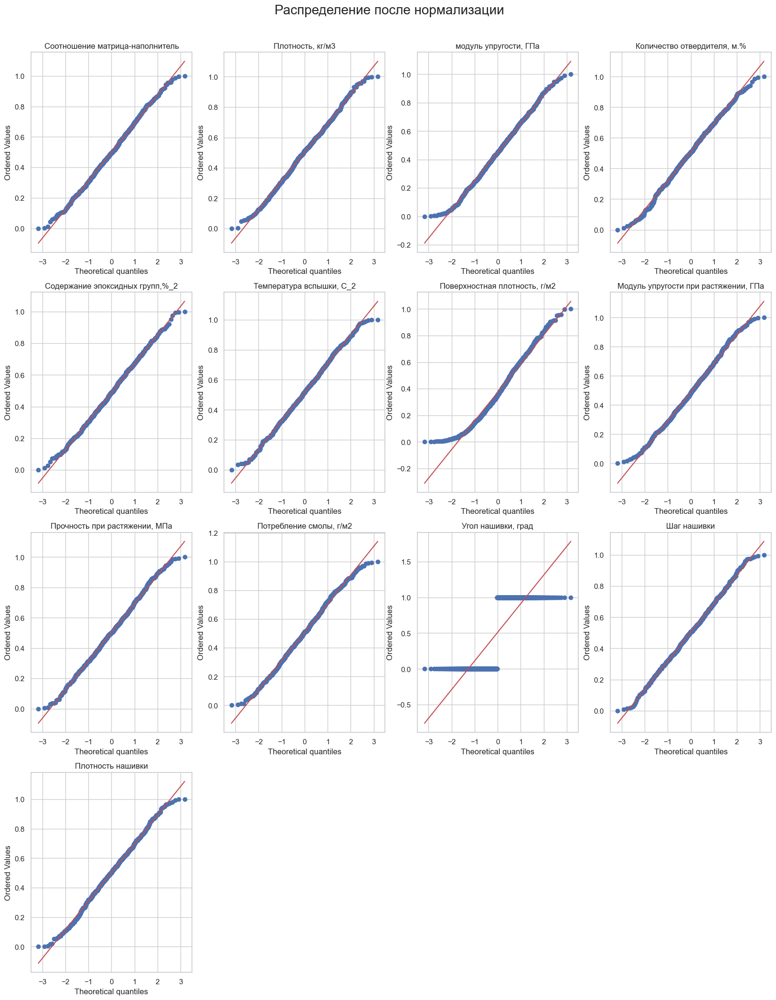

In [59]:
# QQ-графики после нормализации
n_subplots = len(df_norm_minmax.columns)                  
n_cols = 4                                                
n_rows = (n_subplots + n_cols - 1) // n_cols              
plt.figure(figsize=(20,25))
plt.suptitle('Распределение после нормализации', fontsize=20,  y=0.92)
for i, col in enumerate(df_norm_minmax.columns, 1):
    plt.subplot(n_rows, n_cols, i)
    stats.probplot(df_norm_minmax[col], dist='norm', plot=plt)
    plt.title(df_norm_minmax[col].name, size=12)
plt.show()

Результат: после нормализации распределение данных значительно не изменилось.

## Модели для прогноза модуля упругости при растяжении и прочности при растяжении

In [60]:
# Создадим копию нормализованного датасета для дальнейшей работы
df_norm = df_norm_minmax.copy()

### Прогнозирование модуля упругости 

In [61]:
# Разделим датасет на тренировочную и тестовую выборки. 
# При построении модели 30% данных оставим на тестирование модели, на остальных происходит обучение моделей. 
X_train_elastic, X_test_elastic, y_train_elastic, y_test_elastic = train_test_split(
                                                                   df_norm.drop(['Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа'], axis=1), 
                                                                   df_norm[['Модуль упругости при растяжении, ГПа']], 
                                                                   test_size = 0.3, 
                                                                   random_state = 42, 
                                                                   shuffle = True
                                                                   )

In [62]:
# Посмотрим размерность тренировочной и тестовой выборок
print('Размер тренировочного датасета: {}\nРазмер тестового датасета:{}'.format(X_train_elastic.shape, X_test_elastic.shape))

Размер тренировочного датасета: (645, 11)
Размер тестового датасета:(277, 11)


In [63]:
X_train_elastic

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
481,0.266219,0.643037,0.278232,0.234584,0.439240,0.321655,0.495611,0.623998,1.0,0.571430,0.433990
650,0.178334,0.586130,0.463191,0.348338,0.616075,0.320131,0.204285,0.391352,1.0,0.317517,0.537455
483,0.297796,0.532890,0.354250,0.758052,0.625457,0.716345,0.348479,0.237919,1.0,0.554280,0.619605
355,0.590224,0.605695,0.692900,0.360136,0.654481,0.389632,0.456376,0.392215,0.0,0.474980,0.306469
850,0.258455,0.170680,0.502517,0.470569,0.576124,0.477262,0.229392,0.682036,1.0,0.623942,0.429910
...,...,...,...,...,...,...,...,...,...,...,...
106,0.803910,0.303772,0.201130,0.287544,0.329381,0.622672,0.026298,0.576014,0.0,0.549851,0.495193
270,0.577452,0.777923,0.431133,0.526907,0.377453,0.646398,0.841346,0.500515,0.0,0.584309,0.410964
860,0.359950,0.378127,0.731477,0.305836,0.655804,0.372042,0.227940,0.590147,1.0,0.380169,0.529197
435,0.517953,0.781825,0.688797,0.467451,0.715422,0.431429,0.226518,0.329278,0.0,0.050576,0.965176


In [64]:
y_train_elastic

,"Модуль упругости при растяжении, ГПа"
481,0.245292
650,0.966796
483,0.395444
355,0.163582
850,0.467485
...,...
106,0.566234
270,0.294088
860,0.791823
435,0.285892


Рассмотрим работу различных моделей на стандартных параметрах.

In [65]:
# Создадим функцию, которая обрабатывает различные модели, переданные в качестве аргумента, и выдает для них метрики эффективности
# Метрики вычисляются как для тестовых данных, так и для тренировочных данных - тренировочные метрики находятся в ()
def Model_Comparision_Train_Test(AllModels, x_train, y_train, x_test, y_test):
    return_df = pd.DataFrame(columns=['Model', 'R2_score', 'MAE', 'MSE', 'RMSE', 'MAPE'])
    for myModel in AllModels:
        myModel.fit(x_train, y_train)

        # Предсказание и вычисление метрик для тренирвоочного набора данных 
        y_pred_train = myModel.predict(x_train)
        r2_score_train, mae_train, mse_train, rmse_train, mape_train = extract_metrics_from_predicted(y_train, y_pred_train)
        
        # Предсказание и вычисление метрик для тестового набора данных 
        y_pred_test = myModel.predict(x_test)
        r2_score_test, mae_test, mse_test, rmse_test, mape_test = extract_metrics_from_predicted(y_test, y_pred_test)
        
        # Создадим обобщающий датафрейм для всех рассчитанных метрик
        summary = pd.DataFrame([[type(myModel).__name__,
                                         ''.join([str(round(r2_score_test,4)), " (", str(round(r2_score_train,4)), ")"]),
                                         ''.join([str(round(mae_test,2)), " (", str(round(mae_train,2)), ")"]),
                                         ''.join([str(round(mse_test,2)), " (", str(round(mse_train,2)), ")"]),
                                         ''.join([str(round(rmse_test,2)), " (", str(round(rmse_train,2)), ")"]),
                                         ''.join([str(round(mape_test,2)), " (", str(round(mape_train,2)), ")"])]],
                                         columns=['Model', 'R2_score', 'MAE', 'MSE', 'RMSE', 'MAPE'])
        return_df = pd.concat([return_df, summary], axis=0)

    # Установим в качестве индекса столбец с названием модели
    return_df.set_index('Model', inplace=True)
    return(return_df)

# Создадим функцию для расчета метрик
def extract_metrics_from_predicted(y_true, y_pred):
    r2 = r2_score(y_true, y_pred)
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mape = mean_absolute_percentage_error(y_true, y_pred)
    return (r2, mae, mse, rmse, mape)

In [66]:
# Рассчитаем метрики для следующих моделей:
KNR = KNeighborsRegressor()
SVReg = SVR()
LR = LinearRegression()
DTR = DecisionTreeRegressor()
Abr = AdaBoostRegressor(base_estimator=DecisionTreeRegressor())
Gbr = GradientBoostingRegressor()
XgbR = XGBRegressor()
RFR = RandomForestRegressor() #n_estimators = 20, max_depth = 10, random_state = 42)
SGDR = SGDRegressor()
LassoR = Lasso(alpha=0.1)

Model_Comparision_Train_Test([KNR, SVReg, LR, DTR, Abr, Gbr, XgbR, RFR, SGDR, LassoR], X_train_elastic, np.ravel(y_train_elastic), X_test_elastic, np.ravel(y_test_elastic))

,R2_score,MAE,MSE,RMSE,MAPE
Model,,,,,
KNeighborsRegressor,-0.1435 (0.197),0.18 (0.14),0.05 (0.03),0.22 (0.17),0.65 (2088968184903.12)
SVR,-0.2554 (0.4649),0.18 (0.11),0.05 (0.02),0.23 (0.14),0.66 (1409875462373.38)
LinearRegression,-0.0245 (0.0172),0.17 (0.15),0.04 (0.04),0.21 (0.19),0.65 (3530183592566.66)
DecisionTreeRegressor,-1.0137 (1.0),0.23 (0.0),0.08 (0.0),0.29 (0.0),0.78 (0.0)
AdaBoostRegressor,-0.082 (0.9999),0.17 (0.0),0.05 (0.0),0.21 (0.0),0.64 (0.0)
GradientBoostingRegressor,-0.1124 (0.4548),0.17 (0.11),0.05 (0.02),0.22 (0.14),0.68 (1828505402718.78)
XGBRegressor,-0.1728 (0.9989),0.18 (0.0),0.05 (0.0),0.22 (0.01),0.7 (28797473498.31)
RandomForestRegressor,-0.025 (0.8494),0.17 (0.06),0.04 (0.01),0.21 (0.07),0.65 (1334496858305.19)
SGDRegressor,-0.0669 (-0.0241),0.17 (0.16),0.04 (0.04),0.21 (0.19),0.64 (3515840230841.68)


Результат: лучшие показатели R2 и MAE на тестовой выборке у алгоритма регрессии «Lasso», на тренировочной выборке - у алгоритмов DecisionTreeRegressor, XGBRegressor и AdaBoostRegressor. 
Обратим внимание на параметр MAPE - неотрицательный с плавающей запятой. Наилучшее значение равно 0.0. 
Но необходимо учесть, что неверные прогнозы могут привести к сколь угодно большим значениям MAPE, особенно если некоторые y_true значения очень близки к нулю. 

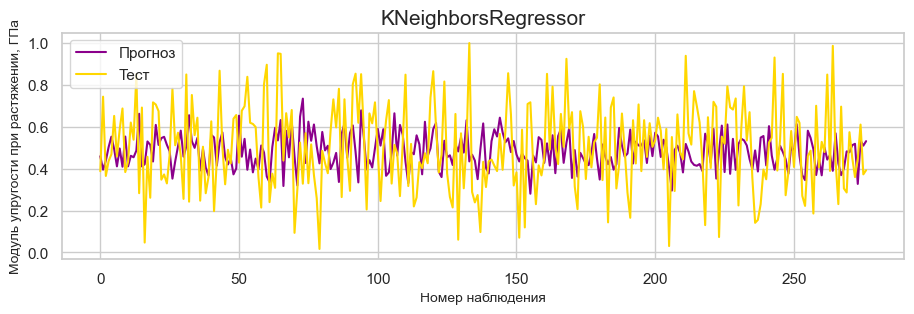

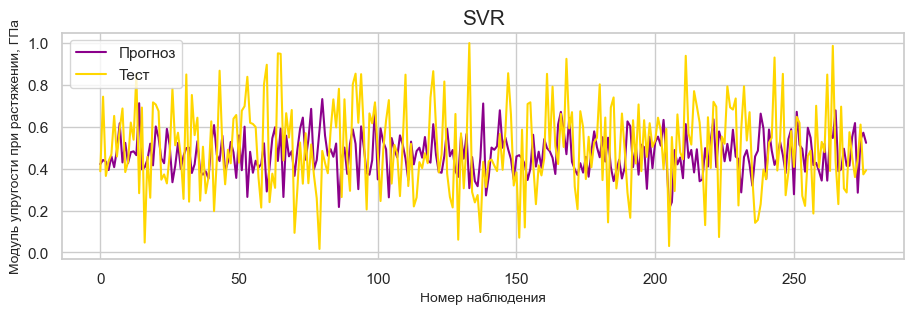

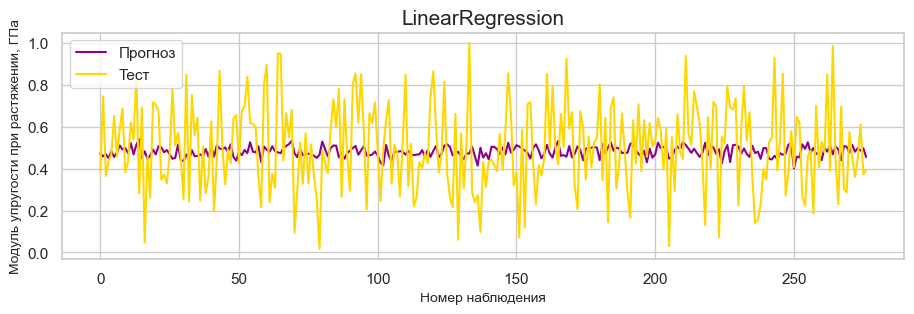

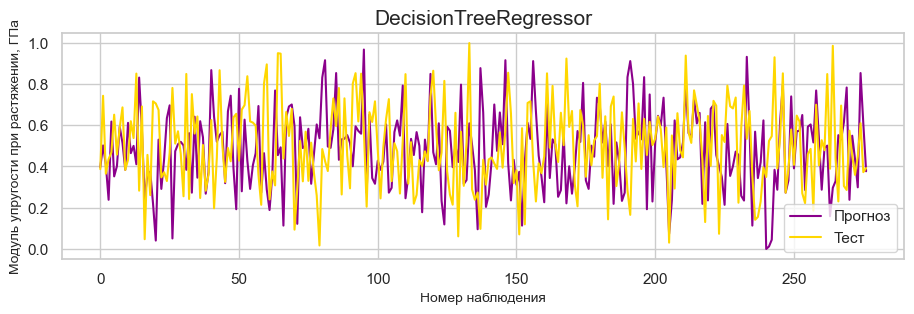

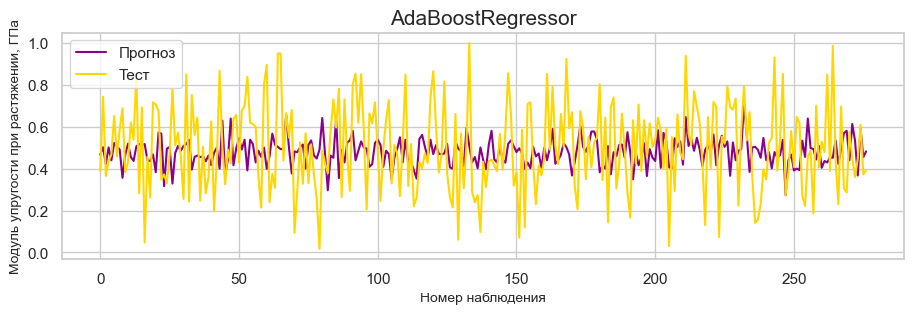

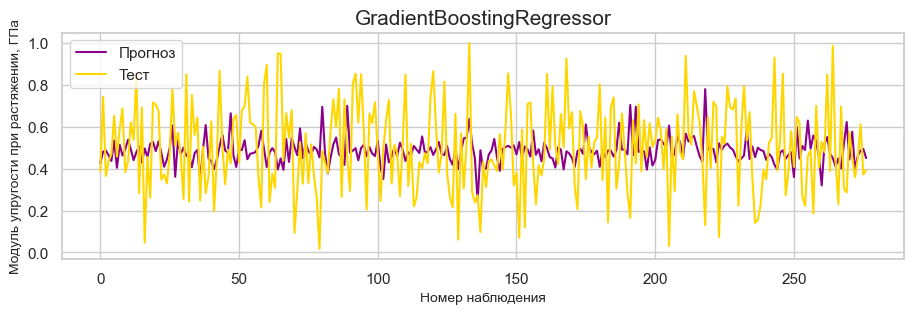

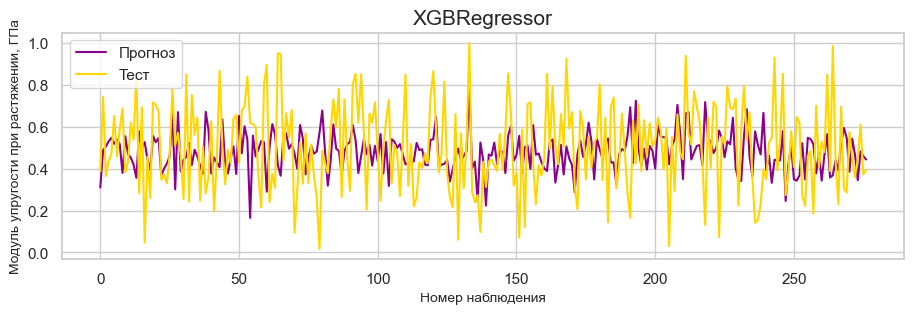

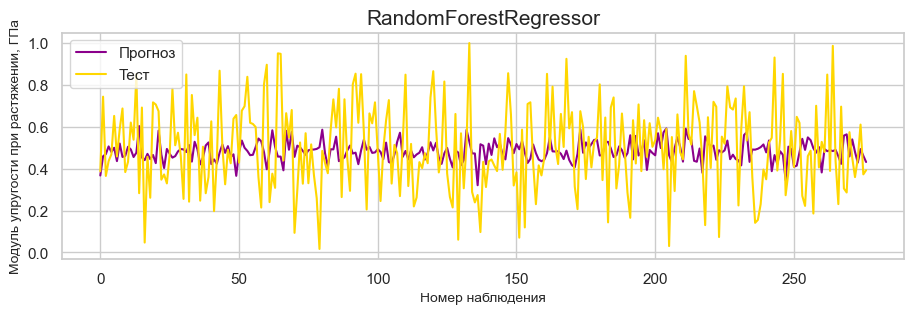

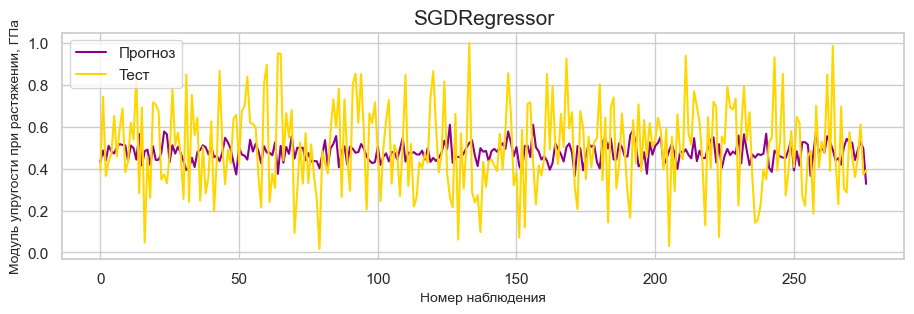

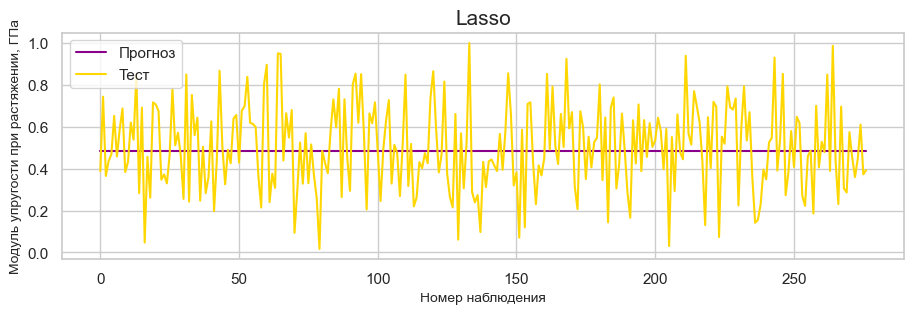

In [67]:
# Визуализируем прогнозные результаты y_pred для каждой модели
def Model_Comparision_Visualization(AllModels, x_train, y_train, x_test, y_test):
    for i, myModel in enumerate(AllModels, 1):
        myModel.fit(x_train, y_train)
        
        # Предсказание значений для тестового набора данных
        y_pred_test = myModel.predict(x_test)
        
        # Рисуем графики для значений у: тестового и прогнозного
        plt.figure(figsize = (50, 10))
        plt.subplot(n_rows, n_cols, i)      
        plt.plot(y_pred_test, label = "Прогноз", color = "darkmagenta")
        plt.plot(y_test, label = "Тест", color = "gold")
        plt.xlabel("Номер наблюдения", size=10)
        plt.ylabel("Модуль упругости при растяжении, ГПа", size=10)
        plt.title(type(myModel).__name__, size=15)
        plt.legend()
        plt.show()         
    
n_subplots = len([KNR, SVReg, LR, DTR, Abr, Gbr, XgbR, RFR, SGDR, LassoR])          
n_cols = 4                                                                          
n_rows = (n_subplots + n_cols - 1) // n_cols                                        

# Выводим на экран графики прогнозных и тестов значений для каждой модели
Model_Comparision_Visualization([KNR, SVReg, LR, DTR, Abr, Gbr, XgbR, RFR, SGDR, LassoR], X_train_elastic, np.ravel(y_train_elastic), X_test_elastic, np.ravel(y_test_elastic))

In [68]:
# Проведем поиск гиперпараметров моделей с помощью поиска по сетке с перекрестной проверкой, количество блоков равно 10 (cv = 10)
# Воспользуемся методом GridSearchCV

# Создадим функцию для выбора лучшей модели
def Model_Selection(x_train, y_train, x_test, y_test):
    best_score = -10.0
    best_regressor = 0
    best_model = ''
    
    # Создаем список всех моделей регрессоров
    regressors = ['kneighborsregressor', 'svr', 'linearregression', 'decisiontreeregressor', 'adaboostregressor', 
                  'gradientboostingregressor', 'xgbregressor', 'randomforestregressor', 'sgdregressor', 'lasso']

    # Создаем словарь с набором всех используемых компонентов пайплайнов
    all_models = {'kneighborsregressor': KNeighborsRegressor(),
                  'svr': SVR(),
                  'linearregression': LinearRegression(),
                  'decisiontreeregressor': DecisionTreeRegressor(),
                  'adaboostregressor': AdaBoostRegressor(base_estimator = DecisionTreeRegressor()),
                  'gradientboostingregressor': GradientBoostingRegressor(),
                  'xgbregressor': XGBRegressor(),
                  'randomforestregressor': RandomForestRegressor(),
                  'sgdregressor': SGDRegressor(),
                  'lasso': Lasso()
                 }

    # Создаем словарь с наборами гиперпараметров всех моделей
    all_params = {'kneighborsregressor':       {'kneighborsregressor__n_neighbors': [i for i in range(1, 201, 2)],
                                                'kneighborsregressor__weights':     ['uniform', 'distance'],
                                                'kneighborsregressor__algorithm':   ['auto', 'ball_tree', 'kd_tree', 'brute']
                                               },
                  'svr':                       {'svr__kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
                                                'svr__C':      [0.01, 0.1, 1],
                                                'svr__gamma':  [0.01, 0.1, 1]
                                               },
                  'linearregression':          {'linearregression__fit_intercept': [True, False]},
                  'decisiontreeregressor':     {'decisiontreeregressor__max_depth':         [3, 5, 7, 9, 11, 13, 15],
                                                'decisiontreeregressor__min_samples_leaf':  [1, 2, 5, 10, 20, 50, 100, 150, 200],
                                                'decisiontreeregressor__min_samples_split': [200, 250, 300],
                                                'decisiontreeregressor__max_features':      ['auto', 'sqrt', 'log2']   
                                               },       
                  'adaboostregressor':         {'adaboostregressor__base_estimator__max_depth':        [i for i in range(2, 11, 2)],
                                                'adaboostregressor__base_estimator__min_samples_leaf': [5,  10],
                                                'adaboostregressor__n_estimators':                     [10, 50, 100, 250, 1000],
                                                'adaboostregressor__learning_rate':                    [0.01, 0.05, 0.1, 0.5]
                                               },
                  'gradientboostingregressor': {'gradientboostingregressor__learning_rate': [0.01,  0.02, 0.03, 0.04],
                                                'gradientboostingregressor__subsample'    : [0.9, 0.5, 0.2, 0.1],
                                                'gradientboostingregressor__n_estimators' : [100, 500, 1000, 1500],
                                                'gradientboostingregressor__max_depth'    : [4, 6, 8, 10]
                                               },
                  'xgbregressor':              {'xgbregressor__learning_rate':    [0.05, 0.10, 0.15],
                                                'xgbregressor__max_depth':        [ 3, 4, 5, 6, 8],
                                                'xgbregressor__min_child_weight': [ 1, 3, 5, 7],
                                                'xgbregressor__gamma':            [ 0.0, 0.1, 0.2],
                                                'xgbregressor__colsample_bytree': [ 0.3, 0.4]
                                               },         
                  'randomforestregressor':     {'randomforestregressor__n_estimators':     [30, 100, 200, 300, 500],
                                                'randomforestregressor__max_depth':        [1, 2, 3, 4, 5, 6, 7, 8],
                                                'randomforestregressor__min_samples_leaf': [1, 2],
                                                'randomforestregressor__max_features':     ['auto', 'sqrt', 'log2']
                                               }, 
                  'sgdregressor':              {'sgdregressor__penalty': ['l2', 'l1', 'elasticnet', None],
                                                'sgdregressor__alpha':   [0.0001, 0.001, 0.01, 0.1]
                                               },
                  'lasso':                     {'lasso__alpha': [0.01, 0.02, 0.1, 0.2, 0.03, 0.3, 0.05, 0.5, 0.07, 0.7, 1]}
                 }

    # Запускаем основной цикл, на каждой итерации которого генерируем очередное сочетание всех этапов пайплайна
    for i, regressor in enumerate(regressors, 1):
        
        # Создаем pipeline для выбора наилучшей модели
        pipe = make_pipeline(all_models[regressor])
    
        # Создаем словарь гиперпараметров для пайплайна
        current_params = {}
        current_params.update(all_params[regressor])
        #print(current_params)
    
        # Выполняем обучение и оценку качества с помощью кросс-валидации, 
        model = GridSearchCV(estimator = pipe, param_grid = current_params,
                             scoring = 'r2', cv = 10, n_jobs = -1)
        model.fit(x_train, y_train)
       
        print('{} Лучшее значение R2 на тренировочной выборке: {:.4f}'.format(all_models[regressor], model.score(x_train, y_train)))
        print('{} Лучшее значение R2 на тестовой выборке {:.4f}'.format(all_models[regressor], model.score(x_test, y_test)))
        print('{} Лучшее значение R2 на перекрестной проверке: {:.4f}'.format(all_models[regressor], model.best_score_))
        print('{} Лучшие параметры модели: {}'.format(all_models[regressor], model.best_params_))
        print('\n______________________________________________________________________________________________________\n')
        if model.score(x_test, y_test) > best_score:
                best_score = model.score(x_test, y_test)
                best_model = model.best_estimator_
                best_regressor = regressor
    print('Регрессор с лучшим значением R2 = {:.4f} на тестовой выборке: {}\n'.format(best_score, all_models[best_regressor]))
    print('Лучший алгоритм:\n{}\n'.format(best_model))

In [69]:
Model_Selection(X_train_elastic, np.ravel(y_train_elastic), X_test_elastic, np.ravel(y_test_elastic))

KNeighborsRegressor() Лучшее значение R2 на тренировочной выборке: 0.0091
KNeighborsRegressor() Лучшее значение R2 на тестовой выборке -0.0105
KNeighborsRegressor() Лучшее значение R2 на перекрестной проверке: -0.0021
KNeighborsRegressor() Лучшие параметры модели: {'kneighborsregressor__algorithm': 'auto', 'kneighborsregressor__n_neighbors': 199, 'kneighborsregressor__weights': 'uniform'}

______________________________________________________________________________________________________

SVR() Лучшее значение R2 на тренировочной выборке: 0.0326
SVR() Лучшее значение R2 на тестовой выборке -0.0146
SVR() Лучшее значение R2 на перекрестной проверке: -0.0031
SVR() Лучшие параметры модели: {'svr__C': 0.01, 'svr__gamma': 1, 'svr__kernel': 'rbf'}

______________________________________________________________________________________________________

LinearRegression() Лучшее значение R2 на тренировочной выборке: 0.0172
LinearRegression() Лучшее значение R2 на тестовой выборке -0.0245
Line

In [70]:
# Рассчитаем метрики для моделей с их лучшими параметрами:
KNR_best = KNeighborsRegressor(algorithm='auto', n_neighbors=199, weights='uniform')
SVReg_best = SVR(C=0.01, gamma=1, kernel='rbf')
LR_best = LinearRegression(fit_intercept=True)
DTR_best = DecisionTreeRegressor(max_depth=9, max_features='sqrt', min_samples_leaf=200, min_samples_split=250)
Abr_best = AdaBoostRegressor(base_estimator=DecisionTreeRegressor(max_depth=2, min_samples_leaf=10), learning_rate=0.01, n_estimators=10)
Gbr_best = GradientBoostingRegressor(learning_rate=0.01, max_depth=4, n_estimators=100, subsample=0.5)
XgbR_best = XGBRegressor(colsample_bytree=0.3, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=5)
RFR_best = RandomForestRegressor(max_depth=1, max_features='log2', min_samples_leaf=2, n_estimators=100)
SGDR_best = SGDRegressor(alpha=0.1, penalty='l1')
LassoR_best = Lasso(alpha=0.01)

Model_Comparision_Train_Test([KNR_best, SVReg_best, LR_best, DTR_best, Abr_best, Gbr_best, XgbR_best, RFR_best, SGDR_best, LassoR_best], X_train_elastic, np.ravel(y_train_elastic), X_test_elastic, np.ravel(y_test_elastic))

,R2_score,MAE,MSE,RMSE,MAPE
Model,,,,,
KNeighborsRegressor,-0.0105 (0.0091),0.17 (0.15),0.04 (0.04),0.21 (0.19),0.65 (3324567063626.71)
SVR,-0.0146 (0.0326),0.17 (0.15),0.04 (0.04),0.21 (0.19),0.65 (3293971898525.6)
LinearRegression,-0.0245 (0.0172),0.17 (0.15),0.04 (0.04),0.21 (0.19),0.65 (3530183592566.66)
DecisionTreeRegressor,0.006 (0.0061),0.17 (0.15),0.04 (0.04),0.2 (0.19),0.65 (3479792181714.39)
AdaBoostRegressor,-0.0066 (0.0228),0.17 (0.15),0.04 (0.04),0.2 (0.19),0.65 (3231476794929.06)
GradientBoostingRegressor,-0.017 (0.1559),0.17 (0.14),0.04 (0.03),0.21 (0.18),0.65 (2959719650427.48)
XGBRegressor,-0.0218 (0.0918),0.17 (0.15),0.04 (0.03),0.21 (0.18),0.66 (3274354675248.97)
RandomForestRegressor,-0.0106 (0.0171),0.17 (0.15),0.04 (0.04),0.21 (0.19),0.66 (3366865472577.18)
SGDRegressor,-0.0092 (-0.0),0.17 (0.16),0.04 (0.04),0.21 (0.19),0.65 (3359840987530.74)


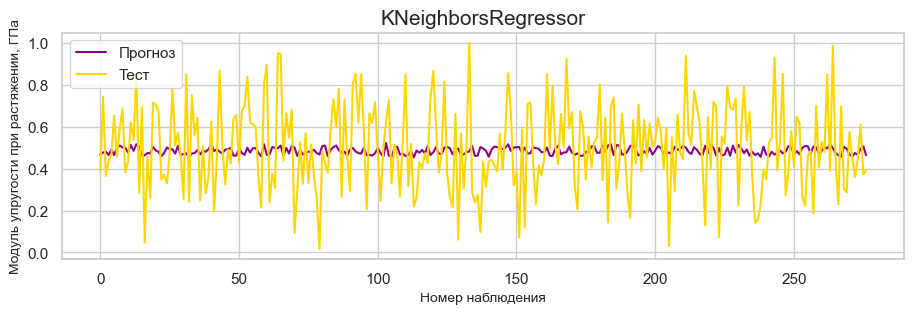

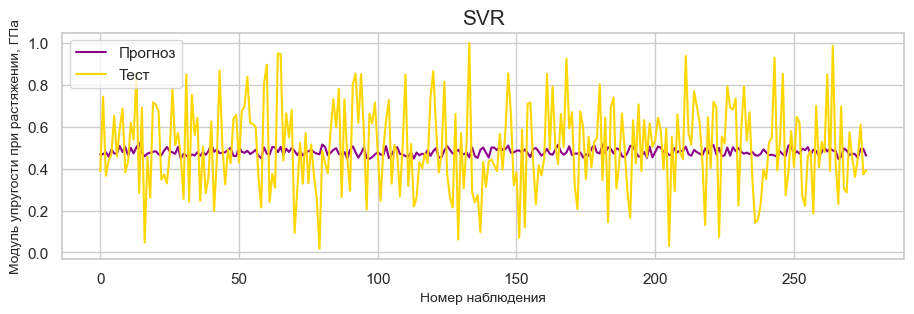

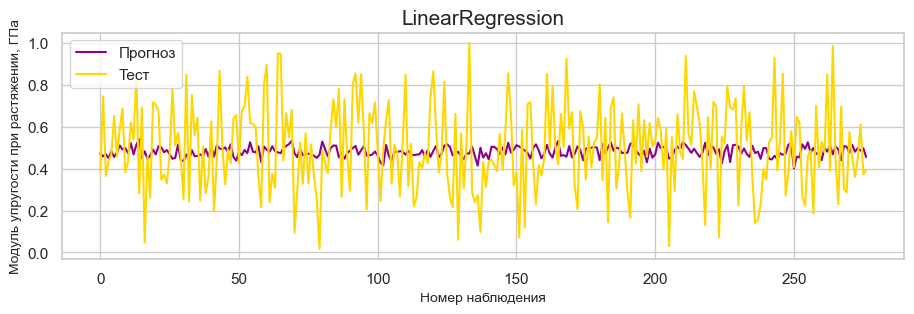

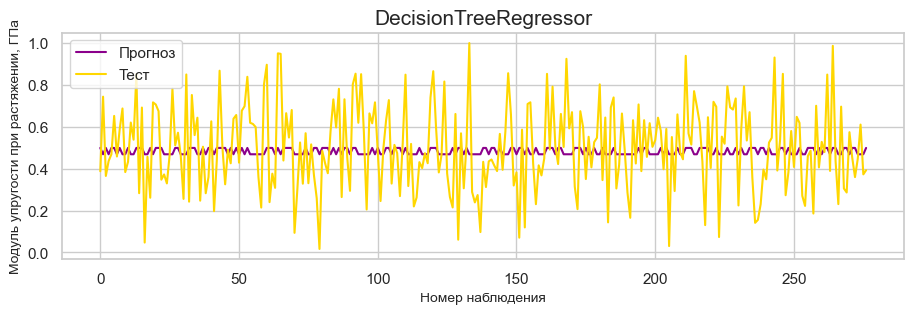

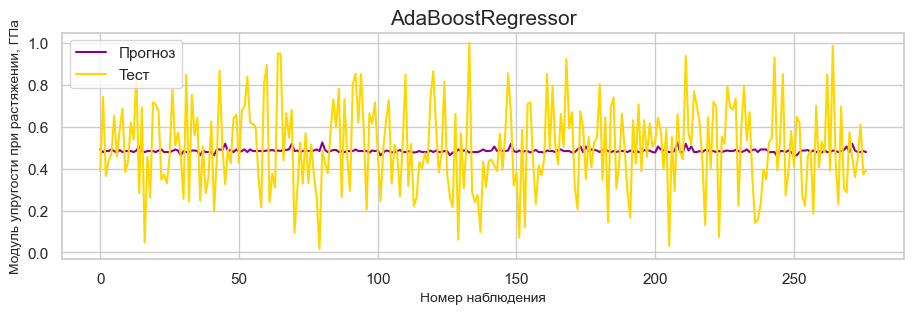

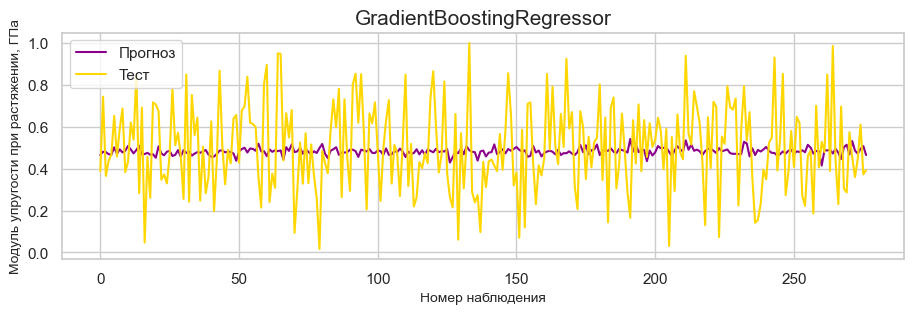

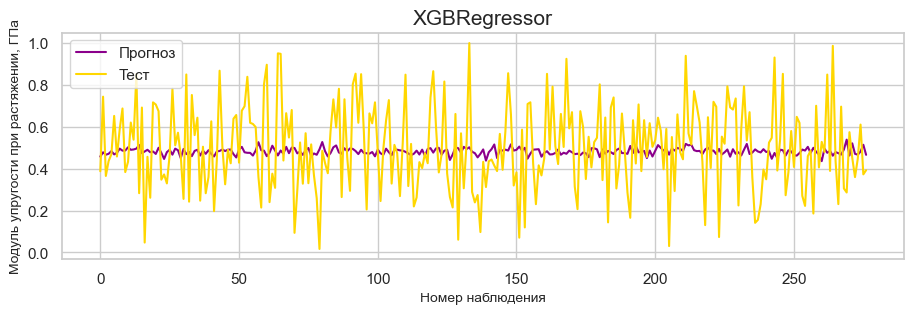

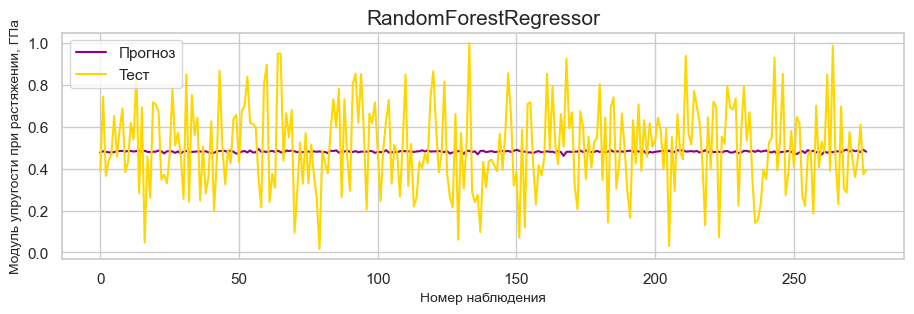

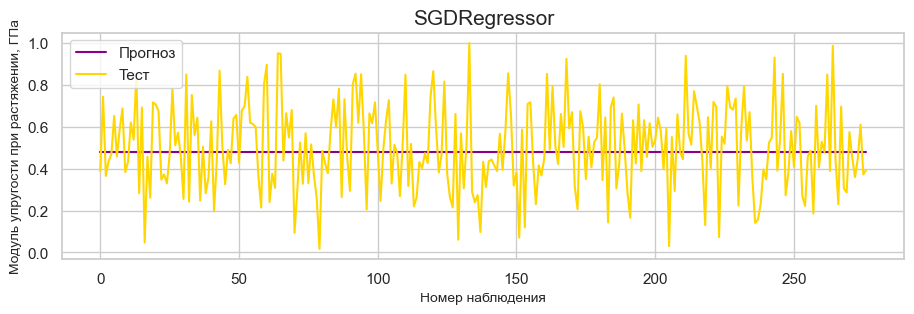

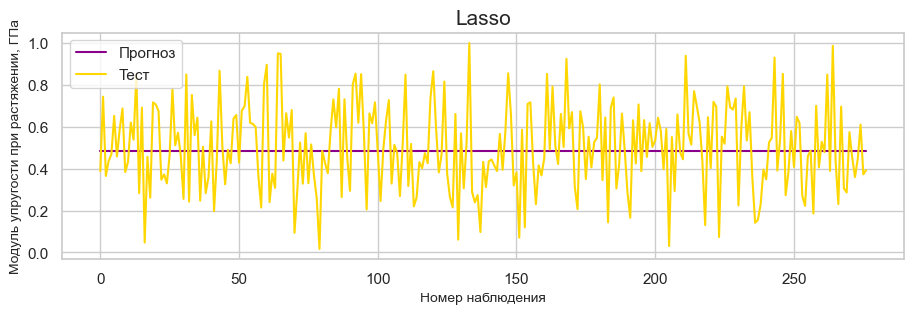

In [71]:
# Визуализируем прогнозные результаты y_pred для каждой модели после настройки гиперпараметров
Model_Comparision_Visualization([KNR_best, SVReg_best, LR_best, DTR_best, Abr_best, Gbr_best, XgbR_best, RFR_best, SGDR_best, LassoR_best], X_train_elastic, np.ravel(y_train_elastic), X_test_elastic, np.ravel(y_test_elastic))

Результат: все использованные модели плохо справились с поставленной задачей прогнозирования модуля упругости при растяжении. 
Получен неудовлетворительный результат.

### Прогнозирование прочности при растяжении

In [72]:
# Разделим датасет на тренировочную и тестовую выборки. 
# При построении модели 30% данных оставим на тестирование модели, на остальных происходит обучение моделей. 
X_train_strong, X_test_strong, y_train_strong, y_test_strong = train_test_split(
                                                               df_norm.drop(['Прочность при растяжении, МПа', 'Модуль упругости при растяжении, ГПа'], axis=1), 
                                                               df_norm[['Прочность при растяжении, МПа']], 
                                                               test_size = 0.3, 
                                                               random_state = 42, 
                                                               shuffle = True
                                                               )

In [73]:
# Посмотрим размерность тренировочной и тестовой выборок
print('Размер тренировочного датасета: {}\nРазмер тестового датасета:{}'.format(X_train_strong.shape, X_test_strong.shape))

Размер тренировочного датасета: (645, 11)
Размер тестового датасета:(277, 11)


In [74]:
X_train_strong

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
481,0.266219,0.643037,0.278232,0.234584,0.439240,0.321655,0.495611,0.623998,1.0,0.571430,0.433990
650,0.178334,0.586130,0.463191,0.348338,0.616075,0.320131,0.204285,0.391352,1.0,0.317517,0.537455
483,0.297796,0.532890,0.354250,0.758052,0.625457,0.716345,0.348479,0.237919,1.0,0.554280,0.619605
355,0.590224,0.605695,0.692900,0.360136,0.654481,0.389632,0.456376,0.392215,0.0,0.474980,0.306469
850,0.258455,0.170680,0.502517,0.470569,0.576124,0.477262,0.229392,0.682036,1.0,0.623942,0.429910
...,...,...,...,...,...,...,...,...,...,...,...
106,0.803910,0.303772,0.201130,0.287544,0.329381,0.622672,0.026298,0.576014,0.0,0.549851,0.495193
270,0.577452,0.777923,0.431133,0.526907,0.377453,0.646398,0.841346,0.500515,0.0,0.584309,0.410964
860,0.359950,0.378127,0.731477,0.305836,0.655804,0.372042,0.227940,0.590147,1.0,0.380169,0.529197
435,0.517953,0.781825,0.688797,0.467451,0.715422,0.431429,0.226518,0.329278,0.0,0.050576,0.965176


In [75]:
y_train_strong

,"Прочность при растяжении, МПа"
481,0.578683
650,0.479890
483,0.569650
355,0.641999
850,0.436179
...,...
106,0.309596
270,0.486406
860,0.627286
435,0.456208


In [76]:
# Рассчитаем метрики для всех моделей
Model_Comparision_Train_Test([KNR, SVReg, LR, DTR, Abr, Gbr, XgbR, RFR, SGDR, LassoR], X_train_strong, np.ravel(y_train_strong), X_test_strong, np.ravel(y_test_strong))

,R2_score,MAE,MSE,RMSE,MAPE
Model,,,,,
KNeighborsRegressor,-0.1709 (0.2163),0.17 (0.13),0.04 (0.03),0.21 (0.17),9889558054234.58 (0.59)
SVR,-0.143 (0.4812),0.17 (0.11),0.04 (0.02),0.21 (0.13),8845741152738.06 (0.49)
LinearRegression,-0.0035 (0.017),0.15 (0.15),0.04 (0.03),0.19 (0.19),9069348467609.18 (0.68)
DecisionTreeRegressor,-0.9151 (1.0),0.21 (0.0),0.07 (0.0),0.27 (0.0),9164318402986.75 (0.0)
AdaBoostRegressor,-0.0758 (0.9998),0.16 (0.0),0.04 (0.0),0.2 (0.0),8488537096248.02 (0.0)
GradientBoostingRegressor,-0.05 (0.5301),0.16 (0.1),0.04 (0.02),0.2 (0.13),8315009586345.83 (0.46)
XGBRegressor,-0.2193 (0.9992),0.17 (0.0),0.05 (0.0),0.21 (0.01),7914619789460.38 (0.01)
RandomForestRegressor,-0.0277 (0.8583),0.16 (0.06),0.04 (0.0),0.2 (0.07),9208673764555.34 (0.25)
SGDRegressor,-0.0457 (-0.0772),0.16 (0.16),0.04 (0.04),0.2 (0.19),6896616647479.92 (0.71)


Результат: лучшие показатели R2 и MAE на тестовой выборке у алгоритма регрессии «Lasso», на тренировочной выборке - у алгоритмов DecisionTreeRegressor, XGBRegressor и AdaBoostRegressor.

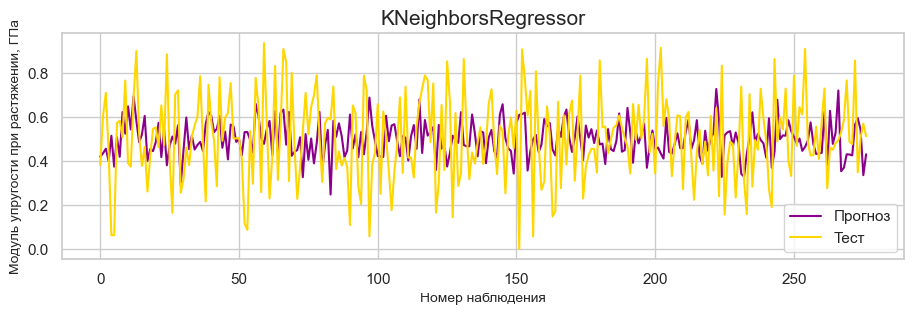

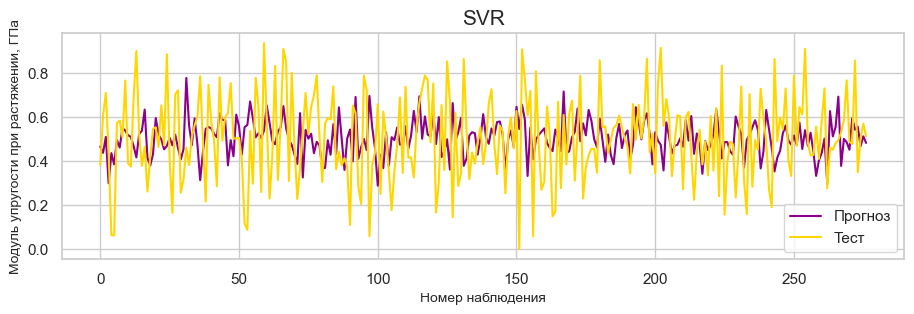

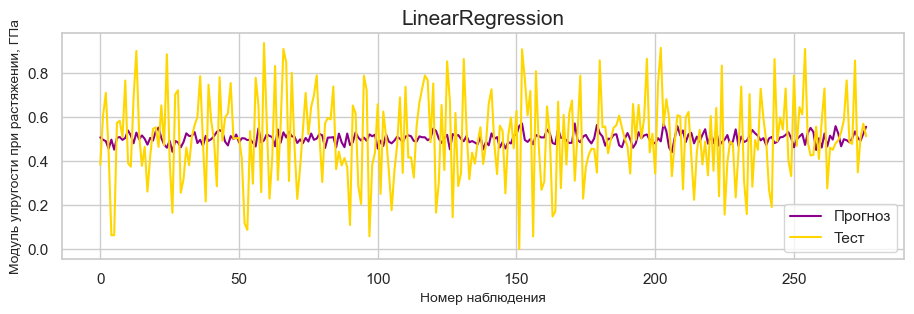

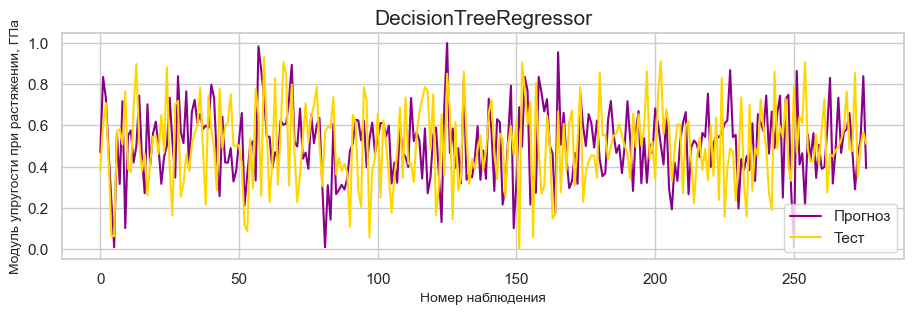

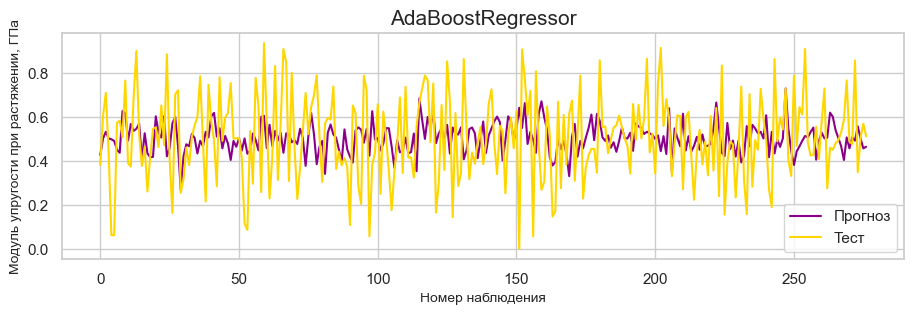

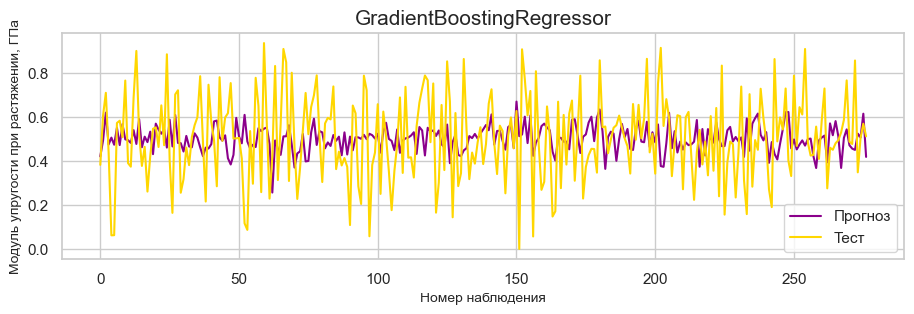

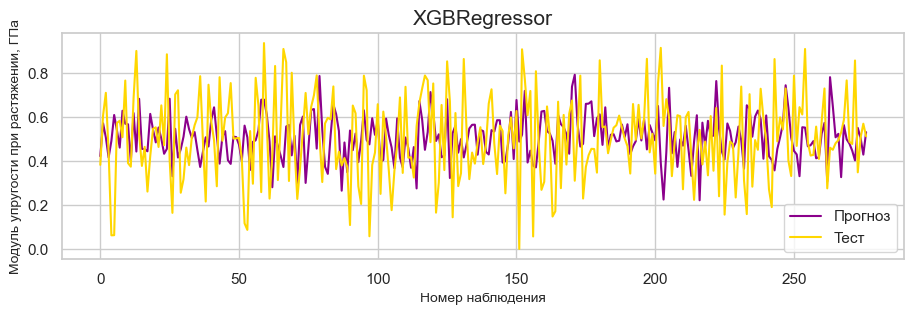

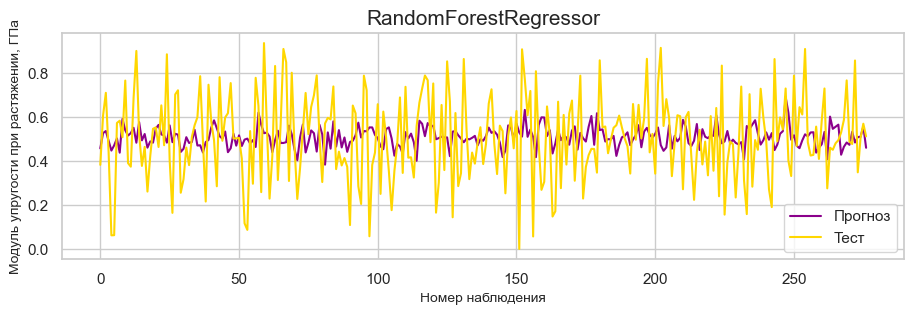

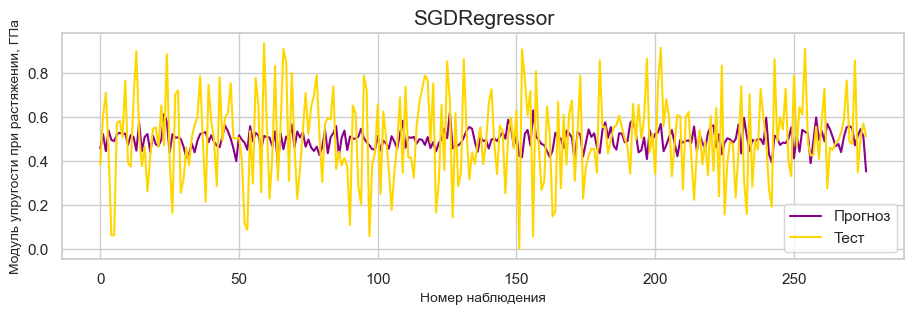

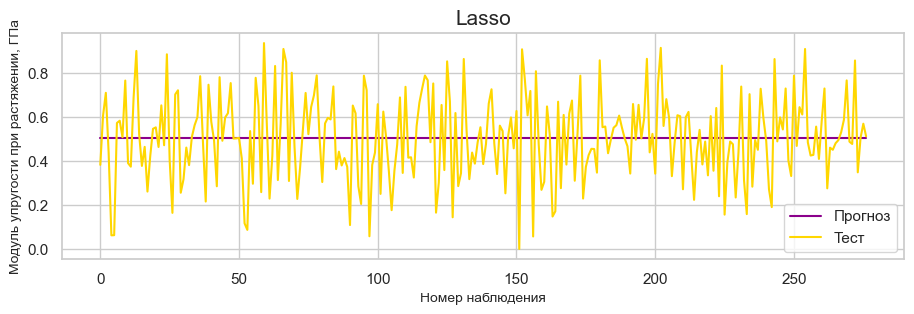

In [77]:
# Визуализируем прогнозные результаты y_pred для каждой модели
Model_Comparision_Visualization([KNR, SVReg, LR, DTR, Abr, Gbr, XgbR, RFR, SGDR, LassoR], X_train_strong, np.ravel(y_train_strong), X_test_strong, np.ravel(y_test_strong))

In [78]:
# Проведем поиск гиперпараметров моделей с помощью поиска по сетке с перекрестной проверкой, количество блоков равно 10 (cv = 10)
Model_Selection(X_train_strong, np.ravel(y_train_strong), X_test_strong, np.ravel(y_test_strong))

KNeighborsRegressor() Лучшее значение R2 на тренировочной выборке: 1.0000
KNeighborsRegressor() Лучшее значение R2 на тестовой выборке -0.0020
KNeighborsRegressor() Лучшее значение R2 на перекрестной проверке: -0.0136
KNeighborsRegressor() Лучшие параметры модели: {'kneighborsregressor__algorithm': 'auto', 'kneighborsregressor__n_neighbors': 159, 'kneighborsregressor__weights': 'distance'}

______________________________________________________________________________________________________

SVR() Лучшее значение R2 на тренировочной выборке: 0.0012
SVR() Лучшее значение R2 на тестовой выборке -0.0012
SVR() Лучшее значение R2 на перекрестной проверке: -0.0103
SVR() Лучшие параметры модели: {'svr__C': 0.01, 'svr__gamma': 0.1, 'svr__kernel': 'poly'}

______________________________________________________________________________________________________

LinearRegression() Лучшее значение R2 на тренировочной выборке: 0.0170
LinearRegression() Лучшее значение R2 на тестовой выборке -0.0035


In [79]:
# Рассчитаем метрики для моделей с их лучшими параметрами:
KNR_best = KNeighborsRegressor(algorithm='auto', n_neighbors=159, weights='distance')
SVReg_best = SVR(C=0.01, gamma=0.1, kernel='poly')
LR_best = LinearRegression(fit_intercept=True)
DTR_best = DecisionTreeRegressor(max_depth=15, max_features='sqrt', min_samples_leaf=100, min_samples_split=250)
Abr_best = AdaBoostRegressor(base_estimator=DecisionTreeRegressor(max_depth=2, min_samples_leaf=10), learning_rate=0.01, n_estimators=50)
Gbr_best = GradientBoostingRegressor(learning_rate=0.01, max_depth=8, n_estimators=100, subsample=0.1)
XgbR_best = XGBRegressor(colsample_bytree=0.3, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=5)
RFR_best = RandomForestRegressor(max_depth=1, max_features='log2', min_samples_leaf=2, n_estimators=30)
SGDR_best = SGDRegressor(alpha=0.1, penalty='l1')
LassoR_best = Lasso(alpha=0.01)

Model_Comparision_Train_Test([KNR_best, SVReg_best, LR_best, DTR_best, Abr_best, Gbr_best, XgbR_best, RFR_best, SGDR_best, LassoR_best], X_train_strong, np.ravel(y_train_strong), X_test_strong, np.ravel(y_test_strong))

,R2_score,MAE,MSE,RMSE,MAPE
Model,,,,,
KNeighborsRegressor,-0.002 (1.0),0.15 (0.0),0.04 (0.0),0.19 (0.0),8176160847752.77 (0.0)
SVR,-0.0012 (0.0012),0.15 (0.15),0.04 (0.03),0.19 (0.19),8151410332325.56 (0.69)
LinearRegression,-0.0035 (0.017),0.15 (0.15),0.04 (0.03),0.19 (0.19),9069348467609.18 (0.68)
DecisionTreeRegressor,-0.0116 (0.0284),0.15 (0.15),0.04 (0.03),0.19 (0.18),8145511233200.83 (0.68)
AdaBoostRegressor,-0.0072 (0.0501),0.15 (0.15),0.04 (0.03),0.19 (0.18),8684037540203.58 (0.67)
GradientBoostingRegressor,-0.0226 (0.161),0.16 (0.14),0.04 (0.03),0.19 (0.17),8432488024396.78 (0.63)
XGBRegressor,0.0005 (0.1155),0.15 (0.14),0.04 (0.03),0.19 (0.18),8709751775321.21 (0.65)
RandomForestRegressor,-0.0011 (0.0231),0.15 (0.15),0.04 (0.03),0.19 (0.18),8410926210985.66 (0.68)
SGDRegressor,-0.0002 (-0.0),0.15 (0.15),0.04 (0.03),0.19 (0.19),8168139964879.41 (0.69)


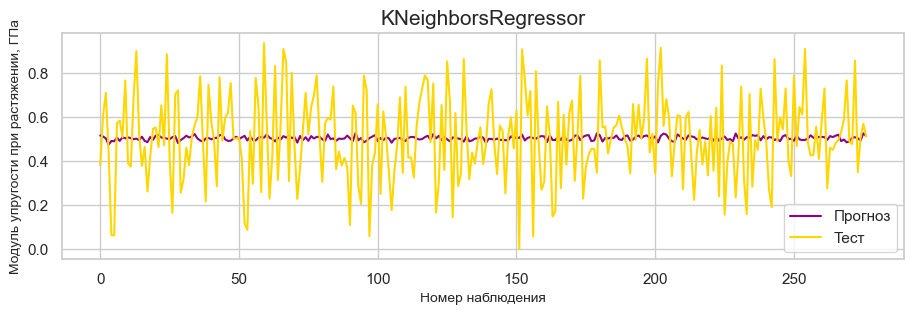

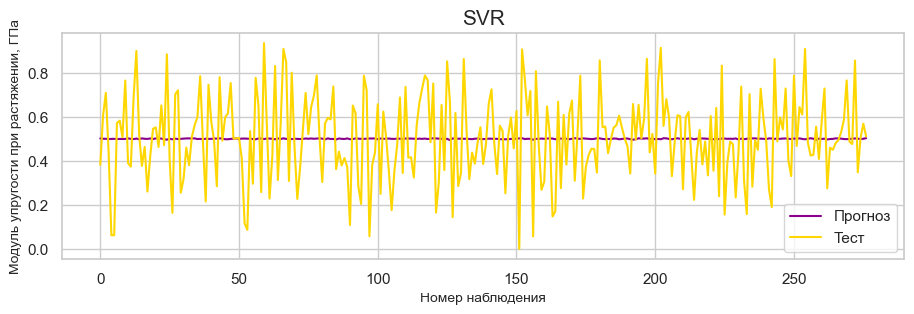

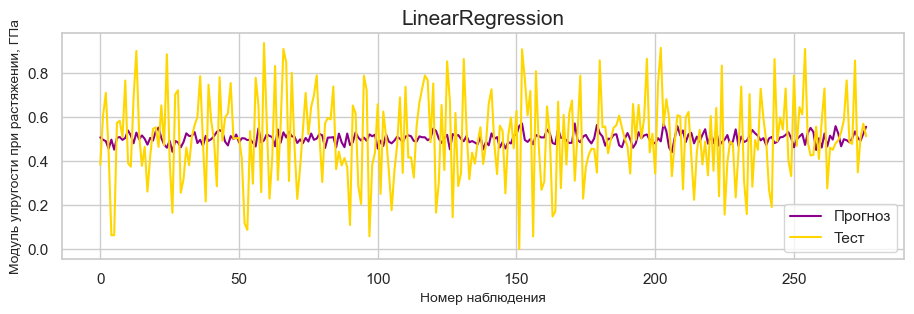

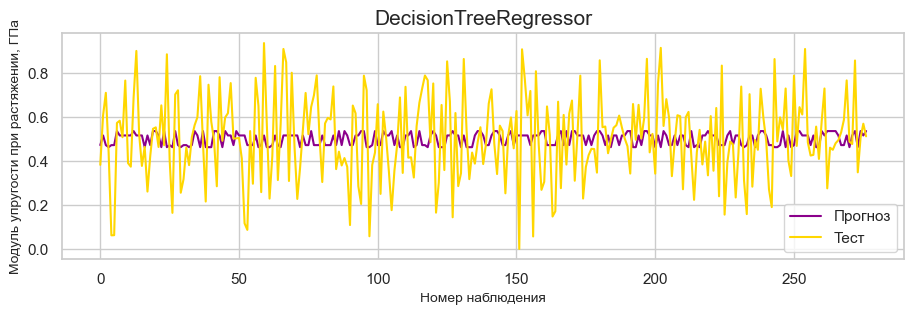

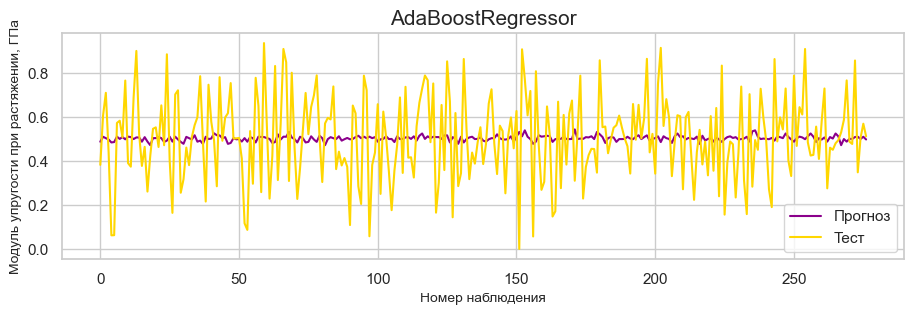

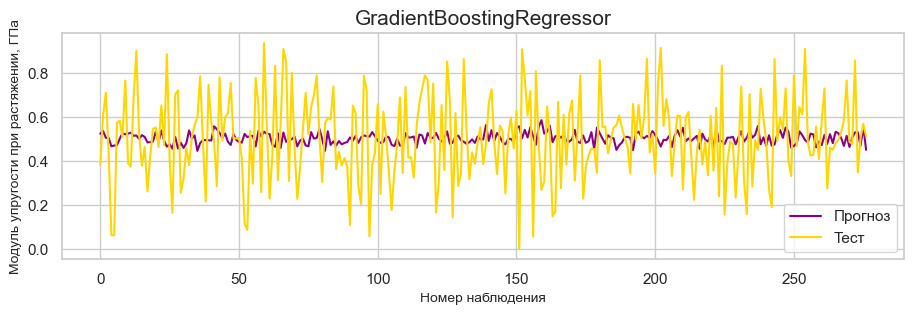

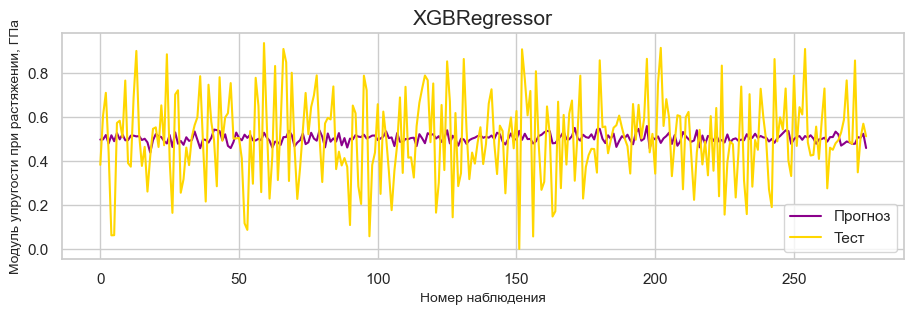

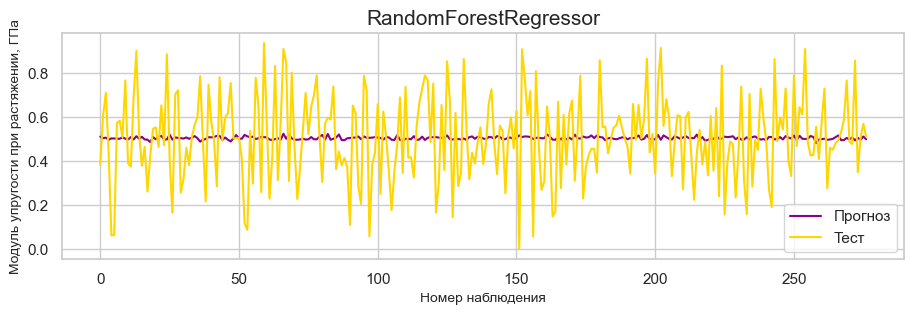

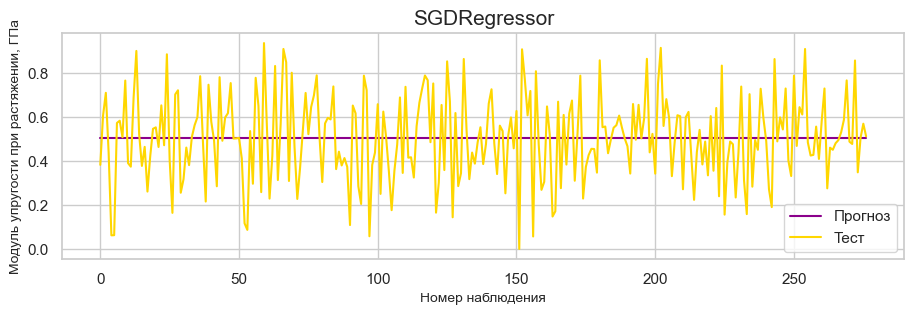

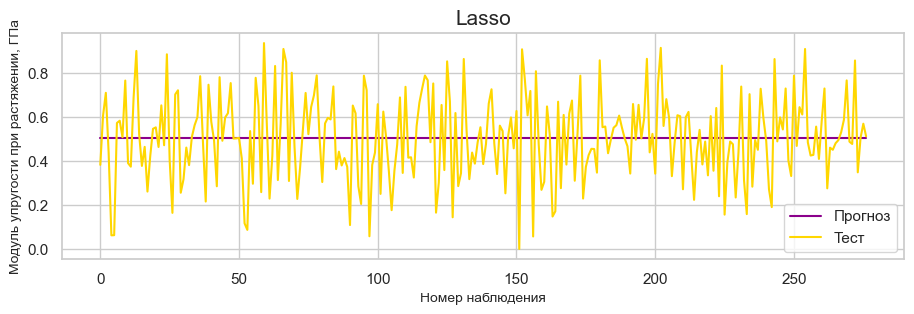

In [80]:
# Визуализируем прогнозные результаты y_pred для каждой модели после настройки гиперпараметров
Model_Comparision_Visualization([KNR_best, SVReg_best, LR_best, DTR_best, Abr_best, Gbr_best, XgbR_best, RFR_best, SGDR_best, LassoR_best], X_train_strong, np.ravel(y_train_strong), X_test_strong, np.ravel(y_test_strong))

Результат: все использованные модели плохо справились с поставленной задачей прогнозирования прочности при растяжении.
Полученный результат не решает поставленную задачу. 
С учетом полученных неудовлетворительных результатов в качестве прогноза для модуля упругости при растяжении и прочности при растяжении можно использовать среднее значение признака

## Нейронная сеть для рекомендации соотношения "матрица - наполнитель"

In [81]:
# Разделим датасет на тренировочную и тестовую выборки. 
# При построении модели 30% данных оставим на тестирование модели, на остальных происходит обучение моделей. 
X_train_matrix, X_test_matrix, y_train_matrix, y_test_matrix = train_test_split(
                                                               df_norm.drop(['Соотношение матрица-наполнитель'], axis=1), 
                                                               df_norm[['Соотношение матрица-наполнитель']], 
                                                               test_size = 0.3, 
                                                               random_state = 42, 
                                                               shuffle = True
                                                               )

In [82]:
# Посмотрим размерность тренировочной и тестовой выборок
print('Размер тренировочного датасета: {}\nРазмер тестового датасета:{}'.format(X_train_matrix.shape, X_test_matrix.shape))

Размер тренировочного датасета: (645, 12)
Размер тестового датасета:(277, 12)


In [83]:
# Создадим функцию для генерации слоев нейронной сети
def create_NN_model(layers, activation, drop, opt): 
        model= Sequential()
        for i, neurons in enumerate(layers):
            if i==0:
                model.add(Dense(neurons, input_dim=X_train_matrix.shape[1], activation = activation))  
            else:
                model.add(Dense(neurons, activation))                                                  
                model.add(Dropout(drop))                                                               
            model.add(Dense(1))                                                                        
        
            model.compile(loss = 'mse', optimizer = opt, metrics = ['mae'])
           
            return model

In [85]:
# Построим нейронную сети с помощью поиска по сетке с перекрестной проверкой, количество блоков равно 5 (cv = 5)
# Воспользуемся методом GridSearchCV

reg = KerasRegressor(model = create_NN_model, layers = [128], activation = 'relu', drop = 0.1, opt = 'Adam', verbose = 2)

# Зададим параметры для модели
param_grid = {'activation': ['relu', 'softmax', 'sigmoid'],
                  'layers': [[128, 64, 16], [128, 128, 64, 32], [128, 128, 64, 16]],                 
                     'opt': ['Adam', 'SGD'],   
                    'drop': [0.0, 0.1, 0.2],   
              'batch_size': [10, 20, 40],     
                  'epochs': [10, 50, 100]
             }            
                                                
# Произведем поиск лучших параметров
grid = GridSearchCV(estimator = reg, 
                    param_grid = param_grid,
                    cv = 5,
                    verbose = 0, 
                    n_jobs = -1)

grid_result = grid.fit(X_train_matrix, np.ravel(y_train_matrix))

Epoch 1/50
65/65 - 1s - loss: 0.1255 - mae: 0.2972 - 642ms/epoch - 10ms/step
Epoch 2/50
65/65 - 0s - loss: 0.0424 - mae: 0.1631 - 71ms/epoch - 1ms/step
Epoch 3/50
65/65 - 0s - loss: 0.0364 - mae: 0.1520 - 69ms/epoch - 1ms/step
Epoch 4/50
65/65 - 0s - loss: 0.0360 - mae: 0.1515 - 69ms/epoch - 1ms/step
Epoch 5/50
65/65 - 0s - loss: 0.0360 - mae: 0.1516 - 64ms/epoch - 987us/step
Epoch 6/50
65/65 - 0s - loss: 0.0360 - mae: 0.1516 - 70ms/epoch - 1ms/step
Epoch 7/50
65/65 - 0s - loss: 0.0360 - mae: 0.1515 - 72ms/epoch - 1ms/step
Epoch 8/50
65/65 - 0s - loss: 0.0360 - mae: 0.1512 - 71ms/epoch - 1ms/step
Epoch 9/50
65/65 - 0s - loss: 0.0360 - mae: 0.1516 - 64ms/epoch - 987us/step
Epoch 10/50
65/65 - 0s - loss: 0.0360 - mae: 0.1516 - 74ms/epoch - 1ms/step
Epoch 11/50
65/65 - 0s - loss: 0.0360 - mae: 0.1515 - 68ms/epoch - 1ms/step
Epoch 12/50
65/65 - 0s - loss: 0.0360 - mae: 0.1514 - 64ms/epoch - 987us/step
Epoch 13/50
65/65 - 0s - loss: 0.0360 - mae: 0.1515 - 71ms/epoch - 1ms/step
Epoch 14/50
6

In [86]:
print('Лучший коэффициент R2: {:.4f} при использовании модели с параметрами {} \n'.format(grid_result.best_score_, grid_result.best_params_))

Лучший коэффициент R2: -0.0025 при использовании модели с параметрами {'activation': 'softmax', 'batch_size': 10, 'drop': 0.2, 'epochs': 50, 'layers': [128, 128, 64, 32], 'opt': 'SGD'} 



In [87]:
# Создадим модель с полученными значениями
best_model = Sequential()
best_model.add(Dense(128, input_dim = X_train_matrix.shape[1], activation = 'softmax'))      # входной слой
best_model.add(Dense(128, activation = 'softmax'))                                           # добавляем полносвязный слой
best_model.add(Dropout(0.0))                                                                 # исключаем переобучения
best_model.add(Dense(64, activation = 'softmax'))                                            # добавляем полносвязный слой
best_model.add(Dropout(0.0))                                                                 # исключаем переобучения
best_model.add(Dense(32, activation = 'softmax'))                                            # добавляем полносвязный слой
best_model.add(Dropout(0.0))                                                                 # исключаем переобучения
best_model.add(Dense(1))                                                                     # выходной слой
 
# Компиляция модели: определяем метрики и алгоритм оптимизации    
best_model.compile(loss = 'mse', 
                   optimizer = 'SGD', 
                   metrics = ['mae'])

# Обучение модели
best_history = best_model.fit(X_train_matrix, np.ravel(y_train_matrix), 
                              epochs=10,
                              batch_size=10,
                              verbose=1, 
                              validation_split=0.2) 

Epoch 1/10
52/52 [==============================] - 1s 5ms/step - loss: 0.1277 - mae: 0.3022 - val_loss: 0.0639 - val_mae: 0.2108
Epoch 2/10
52/52 [==============================] - 0s 3ms/step - loss: 0.0466 - mae: 0.1709 - val_loss: 0.0408 - val_mae: 0.1611
Epoch 3/10
52/52 [==============================] - 0s 3ms/step - loss: 0.0372 - mae: 0.1532 - val_loss: 0.0374 - val_mae: 0.1527
Epoch 4/10
52/52 [==============================] - 0s 2ms/step - loss: 0.0360 - mae: 0.1506 - val_loss: 0.0368 - val_mae: 0.1518
Epoch 5/10
52/52 [==============================] - 0s 2ms/step - loss: 0.0358 - mae: 0.1512 - val_loss: 0.0367 - val_mae: 0.1518
Epoch 6/10
52/52 [==============================] - 0s 2ms/step - loss: 0.0358 - mae: 0.1511 - val_loss: 0.0367 - val_mae: 0.1517
Epoch 7/10
52/52 [==============================] - 0s 2ms/step - loss: 0.0358 - mae: 0.1513 - val_loss: 0.0367 - val_mae: 0.1517
Epoch 8/10
52/52 [==============================] - 0s 2ms/step - loss: 0.0358 - mae: 0.15

In [88]:
# Оценка получившейся модели
best_model.evaluate(X_test_matrix, np.ravel(y_test_matrix), verbose = 1)

9/9 [==============================] - 0s 2ms/step - loss: 0.0336 - mae: 0.1490


[0.033644143491983414, 0.149032860994339]

In [89]:
# Структура нейронной сети   
best_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2 (Dense)             (None, 128)               1664      
                                                                 
 dense_3 (Dense)             (None, 128)               16512     
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 dense_4 (Dense)             (None, 64)                8256      
                                                                 
 dropout_1 (Dropout)         (None, 64)                0         
                                                                 
 dense_5 (Dense)             (None, 32)                2080      
                                                                 
 dropout_2 (Dropout)         (None, 32)               

In [90]:
# Напишем функцию для построения графика потерь на тренировочной и тестовой выборок
def model_loss_plot(model_history):
    plt.figure(figsize = (25,15))
    plt.plot(model_history.history['loss'], label = 'Ошибка на обучающей выборке', color = "gold")
    plt.plot(model_history.history['val_loss'], label = 'Ошибка на валидацинной (тестовой) выборке', color = "darkmagenta")
    plt.title('График потерь модели', size=25, y=1.02)
    plt.ylabel('Значение ошибки MAE', size=20)
    plt.xlabel('Эпоха', size=20)
    plt.legend(prop={'size': 18})
    plt.show()

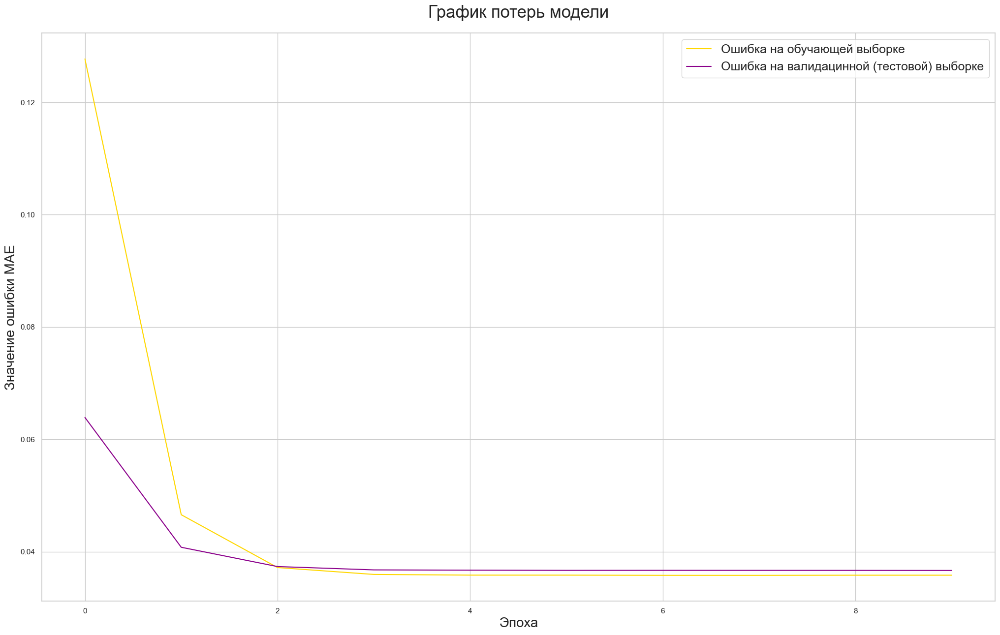

In [91]:
# Построим график потерь на тренировочной и тестовой выборках
model_loss_plot(best_history)

In [92]:
# Создадим функцию для визуализации прогнозных результатов y_pred для модели
def Comparision_Visualization_NN(y_test, y_pred):
    plt.figure(figsize=(15,7))
    plt.title(f'Тест и прогноз, Соотношение матрица-наполнитель', size=15)
    plt.plot(np.ravel(y_test), label = 'Тест', color = "gold")
    plt.plot(y_pred, label = 'Прогноз', color = "darkmagenta")
    plt.xlabel("Номер наблюдения", size=10)
    plt.ylabel("Соотношение матрица-наполнитель", size=10)
    plt.legend(loc='best')
    plt.show()

9/9 [==============================] - 0s 1ms/step


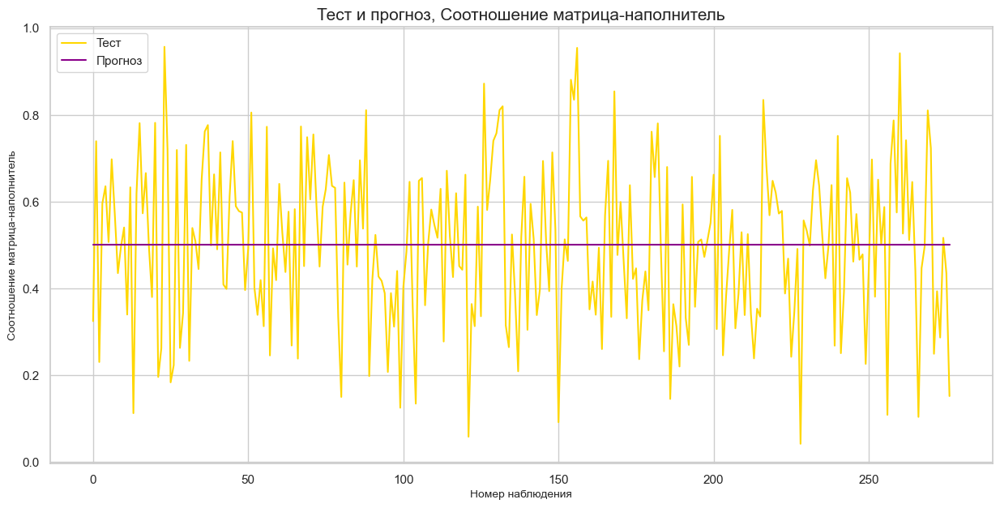

In [93]:
Comparision_Visualization_NN(y_test_matrix, best_model.predict(X_test_matrix))

Результат: прогноз нейронной сети неудовлетворительный. Значение функции потерь - среднего квадрата ошибки (MSE) - составило 0.0336, а средней абсолютной ошибки (MAE) - 0.1491. Полученная модель нейронной сети плохо справились с поставленной задачей прогнозирования соотношения "матрица-наполнитель".

In [94]:
# Сохраняем модель для дальнейшего испльзования в приложении
best_model.save('model_matrix', 'C:/Users/AYAmankin/Desktop/Курс Data science МГТУ/ВКР/ВКР/Application/0. ВКР')

INFO:tensorflow:Assets written to: model_matrix\assets


INFO:tensorflow:Assets written to: model_matrix\assets


In [95]:
# Сохраняем модель для дальнейшего испльзования в приложении
dump(best_model, 'best_model_matrix')

INFO:tensorflow:Assets written to: C:\Users\AYAMAN~1\AppData\Local\Temp\tmprng_3xfn\assets


INFO:tensorflow:Assets written to: C:\Users\AYAMAN~1\AppData\Local\Temp\tmprng_3xfn\assets


['best_model_matrix']

## 6. Разработка приложения для прогнозирования соотношения "матрица-наполнитель"

Создадим два варианта приложения:

* веб-приложение
* консольное

#### Веб-приложение Flask

Для удобства использования создан отдельный файл Application.ipynb

In [110]:
# Инициализируем приложение Flask
app = Flask(__name__)

In [111]:
# Загружаем модель и масштабаторы
nn_model = load_model('C:/Users/AYAmankin/Desktop/Курс Data science МГТУ/ВКР/ВКР/Application//model_matrix/')
scaler_x = load('C:/Users/AYAmankin/Desktop/Курс Data science МГТУ/ВКР/ВКР/Application//minmax_scl_x.pkl')
scaler_y = load('C:/Users/AYAmankin/Desktop/Курс Data science МГТУ/ВКР/ВКР/Application//minmax_scl_y.pkl')

In [112]:
# Определяем маршрут приложения для страницы веб-приложения по умолчанию
@app.route('/')
def home():
    return render_template('main.html')

In [113]:
# Создаем новый маршрут приложения, который считывает ввод из формы «main.html» 
# и при нажатии кнопки "Рассчитать" выводит результат
@app.route('/predict', methods = ['POST'])
def predict():
    int_features = [float(x) for x in request.form.values()]
    X = scaler_x.transform(np.array(int_features).reshape(1,-1))
    prediction = nn_model.predict(X)
    output = scaler_y.inverse_transform(prediction) 
    return render_template('main.html', 
                           prediction_text = 'Прогнозное значение соотношения "матрица - наполнитель": {}'.format(output[0][0]))

In [ ]:
# Запуск сервера Flask
if __name__ == "__main__":
    app.run(debug=True, use_reloader=False)

 * Serving Flask app "__main__" (lazy loading)
 * Environment: production
   Use a production WSGI server instead.
 * Debug mode: on


INFO:werkzeug: * Running on http://127.0.0.1:5000/ (Press CTRL+C to quit)


Приложение выдает значение 2.914088010787964

Соотношение "матрица-наполнитель" для аналогичных показателей (позиция 3 датафрейма df_clean) составляет 2.767918

In [ ]:
df_clean.iloc[3]